In [1]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
class MSMRBFNN(nn.Module):
    def __init__(self, in_feature, add_rbf_num, device):
        super(MSMRBFNN, self).__init__()

        self.add_rbf_num = add_rbf_num  # additional RBFs number
        self.in_feature = in_feature    # count features
        self.device = device
        self.centers_list = []
        self.sigmas_list = []
        self.weights_list = []
        self.Mulitcenters_list = []
        self.Multisigmas_list = []
        self.Multiweights_list = []


        self.change_th = 3
    
    def find_longest_continuous_sequence(self, tensor, add_rbf_num):
        center_index_list = []

        for _ in range(add_rbf_num):
            max_length = 0
            current_length = 0
            max_start_index = 0

            for i in range(1, tensor.size(0)):
                if tensor[i] == tensor[i-1] + 1:
                    current_length += 1
                    if current_length > max_length:
                        max_length = current_length
                        max_start_index = i - max_length
                else:
                    current_length = 0

            center_value = tensor[(max_start_index + (max_start_index + max_length + 1)) // 2]
            center_index_list.append(center_value.unsqueeze(0))

            # 중심값을 제외한 다음 연속된 수열을 찾기 위해 텐서에서 해당 값들 제거
            tensor = tensor[(tensor < tensor[max_start_index]) | (tensor > tensor[max_start_index] + max_length)]
        center_index_list = torch.cat(center_index_list)

        return center_index_list

    def first_rbf_parameter(self, input_data, target, masking): # done

        # input_data shape : (data_num)
        # target data shape : (in_feature, data_num)
        
        # first layer centers, weights, sigmas
        # centers, sigmas : (add_rbf_num, 1)
        # weights : (in_feature, add_rbf_num)

        find_index_input = input_data.clone().detach()
        fine_index_target = target.clone().detach()

        find_sigma = masking.clone().detach()
        find_weight = target.clone().detach()
        center_index_list = []

        # first MultiRBFs initial centers and weights parameters
        masked = torch.where((torch.sum(self.rbf_masking, dim = 0) > 1) & (torch.sum(self.rbf_masking, dim = 0) < (self.in_feature // 2 + 1)))[0]
        MultiCenter_list = self.find_longest_continuous_sequence(masked, self.add_rbf_num)

        Multicenter = torch.index_select(find_index_input, 0, MultiCenter_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)
        Multiweight = torch.index_select(find_weight, 1, MultiCenter_list)[::,-self.add_rbf_num:].reshape(self.in_feature, self.add_rbf_num)
        
        max_indices = torch.max(torch.abs(Multiweight), dim=0)[1]
        Multiweight = Multiweight[max_indices, torch.arange(Multiweight.shape[1])].reshape(1, self.add_rbf_num)
        Multisigma = torch.index_select(find_sigma, 0, MultiCenter_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)

        for i in range(self.add_rbf_num):
            index_ = torch.argmax(torch.sum(torch.abs(fine_index_target), dim = 0)).cpu().detach().tolist()
            while index_ in masked:
                index_ = torch.argmax(torch.sum(torch.abs(fine_index_target), dim = 0)).cpu().detach().tolist()
            fine_index_target[:,index_] = 0
            center_index_list.append(index_)

        center_index_list = torch.tensor(center_index_list, device= self.device)
        initcenter = torch.index_select(find_index_input, 0, center_index_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)
        initweight = torch.index_select(find_weight, 1, center_index_list)[::,-self.add_rbf_num:].reshape(self.in_feature, self.add_rbf_num)              

        initsigma = torch.index_select(find_sigma, 0, center_index_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)

        return initcenter, initweight, initsigma, Multicenter, Multiweight, Multisigma
    
    def add_rbf_parameter(self, input_data, error, masking):
        
        find_index_input = input_data.clone().detach()
        find_index_error = error.clone().detach()
        
        find_weight = error.clone().detach()
        find_sigma = masking.clone().detach()

        masked = torch.where((torch.sum(self.rbf_masking, dim = 0) > 1) & (torch.sum(self.rbf_masking, dim = 0) < (self.in_feature // 2 + 1)))[0]

        MultiCenter_list = self.find_longest_continuous_sequence(masked, self.add_rbf_num)

        Multicenter = torch.index_select(find_index_input, 0, MultiCenter_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)
        Multiweight = torch.index_select(find_weight, 1, MultiCenter_list)[::,-self.add_rbf_num:].reshape(self.in_feature, self.add_rbf_num)
        max_indices = torch.max(torch.abs(Multiweight), dim=0)[1]
        Multiweight = Multiweight[max_indices, torch.arange(Multiweight.shape[1])].reshape(1, self.add_rbf_num)
        print(Multiweight)

        Multisigma = torch.index_select(find_sigma, 0, MultiCenter_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)
        
        center_index_list = []

        for i in range(self.add_rbf_num * (self.change_time + 1)):
            index_ = torch.argmax(torch.sum(torch.abs(find_index_error), dim = 0)).cpu().detach().tolist()
            while index_ in masked:
                find_index_error[:,index_] = 0
                index_ = torch.argmax(torch.sum(torch.abs(find_index_error), dim = 0)).cpu().detach().tolist()
            find_index_error[:,index_] = 0
            center_index_list.append(index_)

        center_index_list = torch.tensor(center_index_list, device=self.device)
        initcenter = torch.index_select(find_index_input, 0, center_index_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)
        initweight = torch.index_select(find_weight, 1, center_index_list)[::,-self.add_rbf_num:].reshape(self.in_feature, self.add_rbf_num)

        initsigma = torch.index_select(find_sigma, 0, center_index_list)[-self.add_rbf_num:].reshape(self.add_rbf_num,1)

        return initcenter, initweight, initsigma, Multicenter, Multiweight, Multisigma
    
    def masking_of_target(self, target, ratio):
        rbf_masking = target.clone().detach()
        indices = torch.nonzero(rbf_masking == 1)  # 배열에서 값이 1인 인덱스 추출
        num_ones = indices.size(0)  # 값이 1인 요소의 개수

        num_zeros_to_replace = int(num_ones * ratio)  # 바꿀 1의 개수 계산
        if num_zeros_to_replace > 0:
            chosen_indices = torch.randperm(num_ones)[:num_zeros_to_replace]  # 바꿀 1의 인덱스를 무작위로 선택

            for index in chosen_indices:
                rbf_masking[indices[index][0], indices[index][1]] = 0  # 선택된 인덱스의 값을 0으로 변경

        return rbf_masking
    
    
    def rbf_gaussian(self, input_data):
        out = torch.exp(-1 *(torch.pow((input_data - self.centers), 2)) / (2 * torch.pow(self.sigma, 2)))

        return out
    
    def rbf_multi(self, input_data):
        out = torch.exp(-1*(torch.pow((input_data - self.Multicenter), 2)) / (2 * torch.pow(self.Multisigma, 2)))
        
        return out

    def forward(self, input_data):
        R = self.rbf_gaussian(input_data)
        R_multi = self.rbf_multi(input_data)

        pred = torch.mm(self.weights, R) + torch.mm(self.Multiweight, R_multi)

        return R, R_multi, pred

    def rbf_gaussian_derivative_centers(self, input_data): # done
        output = ((input_data - self.centers) / (torch.pow(self.sigma, 2))) * self.rbf_gaussian(input_data)

        return output  # size = (add_rbf_num, data_num)

    def rbf_gaussian_derivative_sigma(self, input_data): # done
        output = (4 * torch.pow((input_data - self.centers), 2) / (torch.pow(self.sigma, 3))) * self.rbf_gaussian(input_data)

        return output  # size = (add_rbf_num, data_num)
    
    def Multi_derivative_centers(self, input_data):
        output = ((input_data - self.Multicenter) / (torch.pow(self.Multisigma, 2))) * self.rbf_multi(input_data)

        return output  # size = (num_radial, 1)
    
    def Multi_derivative_sigma(self, input_data):
        output = (4 * torch.pow((input_data - self.Multicenter), 2) / (torch.pow(self.Multisigma, 3))) * self.rbf_multi(input_data)

        return output  # size = (num_radial, 1)
    
    # FUNCTION GRADIENT
    def rbf_gradient(self, input_data, centers, sigmas, weights):
        rbf_output = (-2 * (input_data-centers) / torch.pow(sigmas,2)) * \
                        (torch.exp(-1 * (torch.pow((input_data - centers), 2) / (torch.pow(sigmas, 2)))))
        rbf_grad = torch.mm(weights, rbf_output)
        
        return rbf_grad
    
    def first_grad(self, input_data, target):
        space = (input_data,)
        for i in range(target.size(0)):
            if i == 0:
                f_grad = torch.gradient(target[i], spacing = space, edge_order  = 1)[0]
            else:
                f_grad = torch.vstack([f_grad, torch.gradient(target[i], spacing = space, edge_order  = 1)[0]])
        return f_grad
    
    def target_grad_compute(self, input_data, centers, sigmas, weights, f_grad):
        true_grad = f_grad - self.rbf_gradient(input_data, centers, sigmas, weights)
        
        return true_grad
    

    def L2_F(self, input_data):
        return -2 * (input_data - self.centers) / torch.pow(self.sigma, 2)
    
    def L2_2_derivateive_weight(self, input_data, radial_output):
        return (-2 *(input_data - self.centers) / torch.pow(self.sigma,2)) * radial_output
    
    def masking(self, target):
    
        # value_masking vector
        value_masking = torch.where(target.isnan(), 0.0, 1.0).to(torch.float64)
        
        return value_masking
    
    def time_interval(self, masking):
        interval = torch.zeros_like(masking)
        for m in range(masking.size(0)):
            for i in range(masking.size(1)):
                after = 0
                before = 0
                after_index = i + 1
                before_index = i - 1
                if i == 0:
                    while after == 0 and after_index < masking.size(1):
                        if masking[m][after_index] != 1:
                            after_index += 1
                        else:
                            after = 1
                            interval[m][i] = (after_index - i) / 2
                elif i == masking.size(1)-1:
                    while before == 0 and before_index > -1:
                        if masking[m][before_index] != 1:
                            before_index -= 1
                        else:
                            before = 1
                            interval[m][i] = (i - before_index) / 2 
                else:
                    after = 0
                    before = 0
                    while before == 0 and before_index > -1:
                        if masking[m][before_index] != 1:
                            before_index -= 1
                        else:
                            before = 1
                    while after == 0 and after_index < masking.size(1):
                        if masking[m][after_index] != 1:
                            after_index += 1
                        else:
                            after = 1
                    interval[m][i] = (after_index - before_index) / 2
        return torch.mean(interval, axis = 0)
                
    # Backpropagation and train

    def BP(self, input_data, target, R, R_multi, pred):

        pred = pred * self.rbf_masking

        L2_1_error = -2 * (target - pred)

        observation_len = torch.sum(self.rbf_masking)

        # sigma update
        deltaSigma1 = self.rbf_gaussian_derivative_sigma(input_data) * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))
        deltaSigma1 *= self.weights.reshape(self.in_feature, self.add_rbf_num, 1)

        deltaSigma = torch.sum(torch.sum(deltaSigma1, dim=2), dim = 0) / observation_len

        # center update
        deltaCenter1 = self.rbf_gaussian_derivative_centers(input_data) * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))
        deltaCenter1 *= self.weights.reshape(self.in_feature, self.add_rbf_num, 1)

        deltaCenter =  torch.sum(torch.sum(deltaCenter1, dim=2), dim = 0) / observation_len
        
        # weight update
        delta_weight1 = torch.sum((R * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))), dim=2)
        delta_weight = delta_weight1 / observation_len

        # Multi RBF update
        MultiSigma1 = self.Multi_derivative_sigma(input_data) * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))
        MultiSigma1 *= self.Multiweight.reshape(1, self.add_rbf_num, 1)

        MultiSigma = torch.sum(torch.sum(MultiSigma1, dim=2), dim = 0) / observation_len

        MultiCenter1 = self.Multi_derivative_centers(input_data) * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))
        MultiCenter1 *= self.Multiweight.reshape(1, self.add_rbf_num, 1)

        MultiCenter =  torch.sum(torch.sum(MultiCenter1, dim=2), dim = 0) / observation_len

        Multiweight1 = torch.sum((R_multi * L2_1_error.reshape(self.in_feature, 1, input_data.size(0))), dim=2)
        Multiweight = torch.sum(Multiweight1, dim = 0) / observation_len

        # BP update
        self.weights -= self.lr * delta_weight
        self.centers -= self.lr * deltaCenter.reshape(self.add_rbf_num, 1)
        self.sigma -= self.lr * deltaSigma.reshape(self.add_rbf_num, 1)

        self.Multiweight -= self.lr * Multiweight.reshape(1, self.add_rbf_num)
        self.Multicenter -= self.lr * MultiCenter.reshape(self.add_rbf_num, 1)
        self.Multisigma -= self.lr * MultiSigma.reshape(self.add_rbf_num, 1)


    def change_init(self, na):
        if na == 1:
            loss_list = self.train_loss_list[-self.change_th:]
            if self.number > self.change_th and max(loss_list) == min(loss_list):
                self.change_time += 1
            elif self.number > self.change_th and loss_list[0] < loss_list[1] and loss_list[1] < loss_list[2]:
                self.change_time += 1
            else:
                self.change_time = 0
        else:
            self.change_time += 1
    
    def plot_train(self, input_data, best_pred, pred_single, pred_multi): #done
        masking_index = torch.ones_like(self.rbf_masking) - self.rbf_masking
        best_pred_masking = best_pred
        if self.in_feature != 1:
            fig, ax = plt.subplots(1, self.in_feature, figsize = (40, 5))
            for i in range(self.in_feature):
                ax[i].scatter(input_data.cpu().detach().numpy(), torch.nan_to_num(self.target[i]).cpu().detach().numpy())
                ax[i].scatter(input_data.cpu().detach().numpy(), best_pred[i].cpu().detach().numpy())
                ax[i].scatter(input_data[masking_index[i] != 0].cpu().detach().numpy(), best_pred[i][masking_index[i] != 0].cpu().detach().numpy())
                ax[i].scatter(input_data.cpu().detach().numpy(), pred_single[i].cpu().detach().numpy())
                ax[i].scatter(input_data.cpu().detach().numpy(), pred_multi[0].cpu().detach().numpy(), c = "darkred")

            plt.show()
        
        else:
            plt.scatter(input_data.cpu().detach().numpy(), torch.nan_to_num(self.target[0]).cpu().detach().numpy())
            plt.scatter(input_data.cpu().detach().numpy(), best_pred_masking[0].cpu().detach().numpy())
            plt.show()

    def best_forward(self, input_data, best_center, best_sigma, best_weight,best_MC, best_MS, best_MW): # ?
        rbf_output = torch.exp(-1 * (torch.pow((input_data - best_center), 2) / \
                                        (2 * torch.pow(best_sigma, 2))))
        
        MultiR = torch.exp(-1 * (torch.pow((input_data - best_MC), 2) / \
                                        (2 * torch.pow(best_MS, 2))))
        
        pred = torch.mm(best_weight, rbf_output) + torch.mm(best_MW, MultiR)

        return pred, torch.mm(best_weight, rbf_output), torch.mm(best_MW, MultiR)
    
    def Loss(self, pred, target, pred_grad, true_grad):
        # value L2 loss  
        pred *= self.value_masking
        pred_grad *= self.value_masking

        x_loss = 0
        x_loss += self.value_loss(pred, target)
        x_loss += self.gradinet_loss(pred_grad, true_grad) 

        return x_loss
    
    def value_loss(self, pred, target):
        pred = pred * self.value_masking
        return torch.sum(torch.abs(pred - target)) /torch.sum(self.value_masking)
    
    def gradinet_loss(self, pred_grad, true_grad):
        # pred_grad *= self.value_masking
        return torch.sum(torch.abs(pred_grad - true_grad)) /torch.sum(self.value_masking)
    
    def pred(self, input_data):
        rbf_output = torch.exp(-1 * (torch.pow((input_data - self.done_centers), 2) / \
                                     (2 * torch.pow(self.done_sigma, 2))))
        MR = torch.exp(-1 * (torch.pow((input_data - self.done_MC), 2) / \
                                     (2 * torch.pow(self.done_MS, 2))))

        pred = torch.mm(self.done_weights, rbf_output) + torch.mm(self.done_MW, MR)

        return rbf_output, pred
        
    def train(self, input_data, target, epochs, lr, loss_th, lr_change_th, masking_rate = 0.5):
        self.lr = lr
        self.target = target.clone().detach()
        self.number = 0
        self.train_loss_list = []
        self.loss_th = loss_th
        self.lr_change_th = lr_change_th
        self.target_mape_th = torch.mean(torch.abs(target)) * 0.05
        self.round_number = 5
        self.change_time = 0
        count_loss_chage = 0
        count_round_change = 0

        break_time = len(input_data) / self.add_rbf_num

        loss = 100000
        self.value_masking = self.masking(self.target)
        self.time_inter = self.time_interval(self.value_masking)

        while self.loss_th < loss:

            print("{}th additional rbflayer".format(self.number))
            
            # first rbflayer
            if self.number == 0:

                self.rbf_masking = self.masking_of_target(self.value_masking, masking_rate)
                self.step_target = torch.nan_to_num(self.target) * self.rbf_masking

                self.centers, self.weights, self.sigma, self.Multicenter, self.Multiweight, self.Multisigma = self.first_rbf_parameter(input_data, self.step_target, self.time_inter)

                for epoch in range(epochs):
                    R, R_multi, pred = self.forward(input_data)
                    rbf_grad = self.rbf_gradient(input_data, self.centers, self.sigma, self.weights) 

                    self.BP(input_data, self.step_target, R,R_multi, pred)
                    R, R_multi, pred = self.forward(input_data)
                    epoch_loss = self.value_loss(pred, torch.nan_to_num(self.target))

                    if epoch == 0:
                        print("{}th additional RBFlayer {}th epoch loss: {}".format(self.number, epoch, epoch_loss))
                        self.best_loss = epoch_loss.clone().detach()
                        self.best_center = self.centers.clone().detach()
                        self.best_sigma = self.sigma.clone().detach()
                        self.best_weight = self.weights.clone().detach()
                        self.best_MW = self.Multiweight.clone().detach()
                        self.best_MS = self.Multisigma.clone().detach()
                        self.best_MC = self.Multicenter.clone().detach()

                    
                    else:
                        if self.best_loss > epoch_loss:
                            self.best_loss = epoch_loss.clone().detach()
                            self.best_center = self.centers.clone().detach()
                            self.best_sigma = self.sigma.clone().detach()
                            self.best_weight = self.weights.clone().detach()
                            self.best_MW = self.Multiweight.clone().detach()
                            self.best_MS = self.Multisigma.clone().detach()
                            self.best_MC = self.Multicenter.clone().detach()


                    if (epoch + 1) % 1000 == 0:
                        print("{}th additional RBFlayer {}th epoch MSE Loss: {}".format(self.number, epoch, epoch_loss))
                    
                # print(self.sigma)

            else:
                self.change_init(na)
                if self.change_time > break_time:
                    break

                # rbf_masking
                self.rbf_masking = self.masking_of_target(self.value_masking, masking_rate)
                self.step_target = torch.nan_to_num(self.target) * self.rbf_masking
                
                self.centers, self.weights, self.sigma, self.Multicenter, self.Multiweight, self.Multisigma = self.add_rbf_parameter(input_data, self.step_target, self.time_inter)

                for epoch in range(epochs):
                    # print('epoch : {}'.format(epoch))
                    R,R_multi, pred = self.forward(input_data)
                    rbf_grad = self.rbf_gradient(input_data, self.centers, self.sigma, self.weights)
                    if epoch == 0:
                        
                        print("{}th additional RBFlayer {}th epoch loss: {}".format(self.number, epoch,
                                                                                        self.value_loss(pred, torch.nan_to_num(self.target))))
                        
                        self.best_loss = self.value_loss(pred, torch.nan_to_num(self.target))
                        self.best_center = self.centers.clone().detach()
                        self.best_sigma = self.sigma.clone().detach()
                        self.best_weight = self.weights.clone().detach()
                        self.best_MW = self.Multiweight.clone().detach()
                        self.best_MS = self.Multisigma.clone().detach()
                        self.best_MC = self.Multicenter.clone().detach()


                    self.BP(input_data, self.step_target, R,R_multi, pred)
                    R, R_multi,pred = self.forward(input_data)

                    epoch_loss = self.value_loss(pred, torch.nan_to_num(self.target))

                    if (epoch + 1) % 1000 == 0:
                        print("{}th additional RBFlayer {}th epoch MSE Loss: {}".format(self.number, epoch, epoch_loss))
                    
                    if self.best_loss > epoch_loss:
                        self.best_loss = epoch_loss.clone().detach()
                        self.best_center = self.centers.clone().detach()
                        self.best_sigma = self.sigma.clone().detach()
                        self.best_weight = self.weights.clone().detach()
                        self.best_MW = self.Multiweight.clone().detach()
                        self.best_MS = self.Multisigma.clone().detach()
                        self.best_MC = self.Multicenter.clone().detach()

            best_pred, pred_single, pred_multi = self.best_forward(input_data, self.best_center, self.best_sigma, self.best_weight, self.best_MC, self.best_MS, self.best_MW)

            if self.number ==0:
                train_loss = self.value_loss(best_pred, torch.nan_to_num(self.target))
            else:
                train_loss = self.value_loss(best_pred, torch.nan_to_num(self.target))

            print("{}th additional RBFlayer best loss : {}".format(self.number, train_loss))

            if self.best_loss < self.lr_change_th:
                count_loss_chage += 1
                self.lr *= 10
                self.lr_change_th *= 0.01
                print("change lr ", self.lr)
                print('----------------------------------------------')
                
            if count_round_change == 0 and train_loss < self.target_mape_th:
                count_round_change += 1
                self.round_number += 1
                print("change round number", self.round_number)
                print('----------------------------------------------')
                
            self.train_loss_list.append(train_loss)

            # additional rbf plot print
            self.plot_train(input_data, best_pred, pred_single, pred_multi)

            if torch.isnan(train_loss) == False:
                na = 1
                self.target = self.target - best_pred  # target update
                loss = train_loss  # loss update
                self.number += 1  # additional rbf number update
                self.centers_list.append(self.best_center)
                self.sigmas_list.append(self.best_sigma)
                self.weights_list.append(self.best_weight)

                self.Mulitcenters_list.append(self.best_MC)
                self.Multisigmas_list.append(self.best_MS)
                self.Multiweights_list.append(self.best_MW)

                self.done_centers = torch.cat(self.centers_list, dim = 0)
                self.done_sigma = torch.cat(self.sigmas_list, dim = 0)
                self.done_weights = torch.cat(self.weights_list, dim = 1)

                self.done_MC = torch.cat(self.Mulitcenters_list, dim = 0)
                self.done_MS = torch.cat(self.Multisigmas_list, dim = 0)
                self.done_MW = torch.cat(self.Multiweights_list, dim = 1)

            else:
                na = 0

In [3]:
df = pd.read_csv("../dataset/pm25_missing.txt").drop(['datetime'], axis = 1)
df = df[df.columns[:10]].reset_index(drop=True)
target = torch.tensor(df.values).T.to(device).reshape(10,len(df))
input = torch.tensor(df.index + 1, dtype=float).to(device)

0th additional rbflayer
0th additional RBFlayer 0th epoch loss: 85.55744726919175
0th additional RBFlayer 999th epoch MSE Loss: 66.37600523489328
0th additional RBFlayer 1999th epoch MSE Loss: 63.12185280675793
0th additional RBFlayer 2999th epoch MSE Loss: 62.04083238932019
0th additional RBFlayer best loss : 62.04083238932019


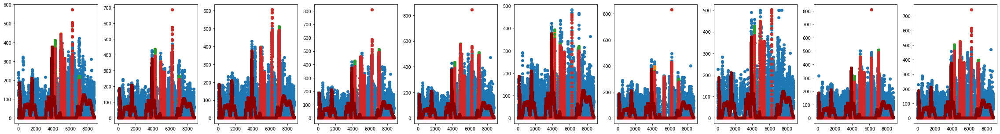

1th additional rbflayer
tensor([[ -38.1566,  -56.6997,  -85.2080,  -22.2882,  -35.9387,   -6.6252,
           15.0910,  -38.0104,  -21.8178,  -53.3609,  -51.6189,  -24.3684,
           28.7277,  -31.7651,   63.7629,  -31.8728, -103.1594,  -61.3202,
           15.5986,  192.0519]], device='cuda:0', dtype=torch.float64)
1th additional RBFlayer 0th epoch loss: 65.67925398119692
1th additional RBFlayer 999th epoch MSE Loss: 56.6292270473354
1th additional RBFlayer 1999th epoch MSE Loss: 56.14706606722769
1th additional RBFlayer 2999th epoch MSE Loss: 55.739755662196586
1th additional RBFlayer best loss : 55.739755662196586


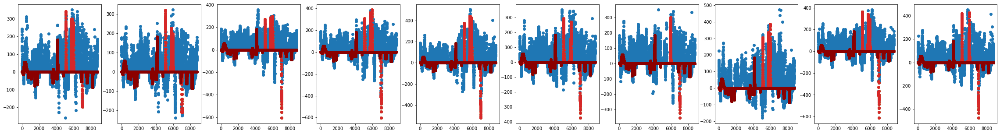

2th additional rbflayer
tensor([[ 28.5108,  17.0600,   4.9726, -84.6081, -57.2348, -13.2175, -20.2753,
          25.9012,   5.5169,  51.0422,  70.3069, -15.7240, -26.6142,  26.4376,
         -30.5377, -23.5655,  73.4992, -41.3013,  94.7782,  79.7698]],
       device='cuda:0', dtype=torch.float64)
2th additional RBFlayer 0th epoch loss: 54.88273722720907
2th additional RBFlayer 999th epoch MSE Loss: 52.79819649112876
2th additional RBFlayer 1999th epoch MSE Loss: 52.61995436269072
2th additional RBFlayer 2999th epoch MSE Loss: 52.524503530596206
2th additional RBFlayer best loss : 52.524503530596206


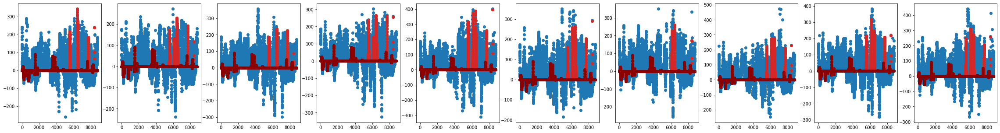

3th additional rbflayer
tensor([[ 13.3299, -20.1726,   6.6060,  -7.9005,  -6.6501,  17.1382, -26.8216,
          -6.2024,  -9.1769,  10.8646,  14.6007, 120.0000,  23.0563,   8.5681,
          38.4696,   7.0216,  12.5655,  28.9434,  59.3117,   9.9642]],
       device='cuda:0', dtype=torch.float64)
3th additional RBFlayer 0th epoch loss: 50.9218902420853
3th additional RBFlayer 999th epoch MSE Loss: 46.78089980554464
3th additional RBFlayer 1999th epoch MSE Loss: 46.11894378981727
3th additional RBFlayer 2999th epoch MSE Loss: 45.50631764035065
3th additional RBFlayer best loss : 45.504527016876246


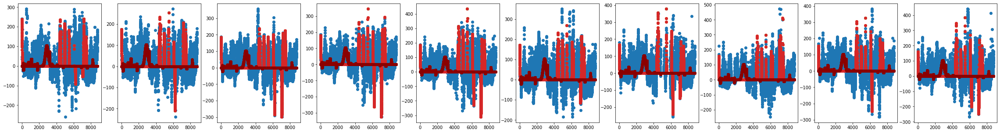

4th additional rbflayer
tensor([[-14.8502,  -6.3332, -24.0195, -18.7871, -32.9702,  35.7696,  70.0465,
           7.3748,   7.2407,  98.0209,  11.4567,  48.9762, -16.6029, -49.4673,
          -9.5579, -58.3362,  -9.5725, 105.4359, -39.4995, -12.1639]],
       device='cuda:0', dtype=torch.float64)
4th additional RBFlayer 0th epoch loss: 45.22428947426499
4th additional RBFlayer 999th epoch MSE Loss: 40.82599467414186
4th additional RBFlayer 1999th epoch MSE Loss: 40.68286728297134
4th additional RBFlayer 2999th epoch MSE Loss: 40.560739707282956
4th additional RBFlayer best loss : 40.5522178551015


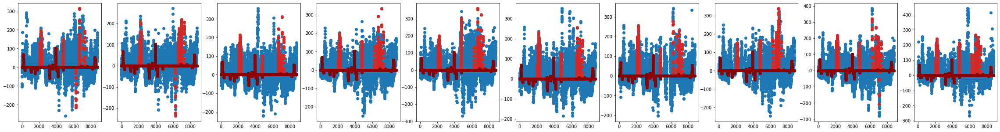

5th additional rbflayer
tensor([[ 38.6692,   5.3413,  18.0688, -14.2615,  -9.5096,  25.0471,  -6.0695,
          23.5055,  24.6020,  19.7322, -15.0449, -18.1830, -15.8231,   5.5992,
         -51.8340, -39.1097, -63.7435,  78.8760,  25.9001,  42.9059]],
       device='cuda:0', dtype=torch.float64)
5th additional RBFlayer 0th epoch loss: 40.233581720991836
5th additional RBFlayer 999th epoch MSE Loss: 37.654907130775676
5th additional RBFlayer 1999th epoch MSE Loss: 37.60297210871572
5th additional RBFlayer 2999th epoch MSE Loss: 37.43859058088014
5th additional RBFlayer best loss : 37.43859058088014


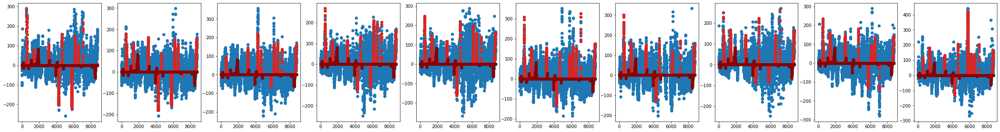

6th additional rbflayer
tensor([[-17.6523, -24.2650,  -6.1649, -14.1344, -25.5739,  18.6454,  12.1538,
           7.2923,   3.5422,  10.6487,  46.2830, -43.8132,  -4.5355, -19.7564,
          29.7544, -34.4455,  -0.5489,  -9.4894,  85.2600,  15.5023]],
       device='cuda:0', dtype=torch.float64)
6th additional RBFlayer 0th epoch loss: 38.91898467817695
6th additional RBFlayer 999th epoch MSE Loss: 35.135430221371486
6th additional RBFlayer 1999th epoch MSE Loss: 35.086166053495255
6th additional RBFlayer 2999th epoch MSE Loss: 35.066484420797394
6th additional RBFlayer best loss : 35.066484420797394


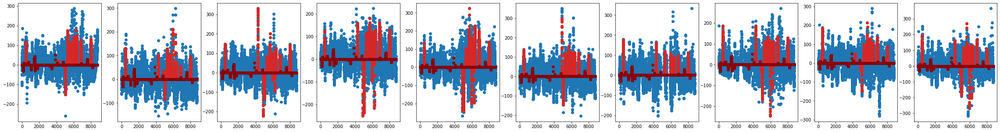

7th additional rbflayer
tensor([[   8.3078,   10.3478,  -22.4656,   20.1439,   18.7413,   -6.9805,
          -27.0358,   -6.2159,  -60.4599,  -13.9122,   12.7794,  -13.4890,
            5.0436,   47.9819, -122.2097,   33.2836,   -4.5490,   84.6891,
           29.5816,   34.8581]], device='cuda:0', dtype=torch.float64)
7th additional RBFlayer 0th epoch loss: 36.0993766289973
7th additional RBFlayer 999th epoch MSE Loss: 33.44460475409693
7th additional RBFlayer 1999th epoch MSE Loss: 33.39352010299428
7th additional RBFlayer 2999th epoch MSE Loss: 33.33373732633227
7th additional RBFlayer best loss : 33.33373732633227


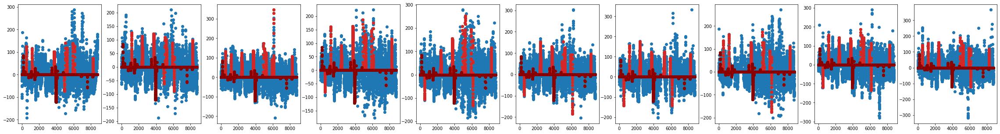

8th additional rbflayer
tensor([[  9.6625,  -3.6953,  32.4610,  29.3162,  12.0432,  -5.5656,  19.5369,
          -7.5132,   7.5785,  26.9709, -21.6174, -16.8352,  10.6391, -45.0337,
          -5.5081,  15.7246,  32.7789, -23.0255, -16.8932, -23.0723]],
       device='cuda:0', dtype=torch.float64)
8th additional RBFlayer 0th epoch loss: 33.473421469535985
8th additional RBFlayer 999th epoch MSE Loss: 32.01379398890861
8th additional RBFlayer 1999th epoch MSE Loss: 31.938189208449653
8th additional RBFlayer 2999th epoch MSE Loss: 31.920557707064102
8th additional RBFlayer best loss : 31.920557707064102


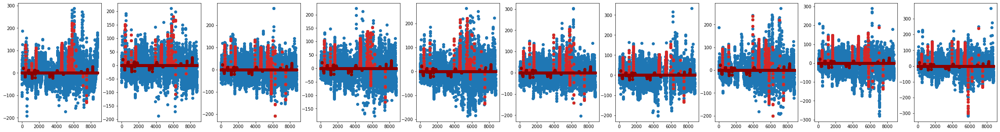

9th additional rbflayer
tensor([[-19.9141,   5.1555, -18.2927,   7.7182,  -3.9721,  -6.9259,  18.6974,
         -50.4171,  -6.2934, -18.5399, -21.3678,   1.5853,  -7.1976,   8.1094,
         -39.6283, -12.8856, -30.1276, -39.5000, -11.6482, -16.4074]],
       device='cuda:0', dtype=torch.float64)
9th additional RBFlayer 0th epoch loss: 32.12924390136113
9th additional RBFlayer 999th epoch MSE Loss: 30.726868583844723
9th additional RBFlayer 1999th epoch MSE Loss: 30.634616657049573
9th additional RBFlayer 2999th epoch MSE Loss: 30.6203965077547
9th additional RBFlayer best loss : 30.6203965077547


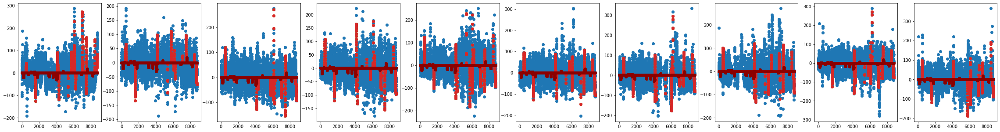

10th additional rbflayer
tensor([[ 16.1741,  28.2097,  11.1830,  15.8049,   1.6774, -10.7970,   6.0965,
         -13.7415,  13.1921,   7.3982, -12.2944, -16.0965,  14.7613,   5.8553,
         -35.8417,  17.1929,  -4.3862,  -6.3767, -32.1636,  59.6396]],
       device='cuda:0', dtype=torch.float64)
10th additional RBFlayer 0th epoch loss: 30.147153698600967
10th additional RBFlayer 999th epoch MSE Loss: 29.013976564507622
10th additional RBFlayer 1999th epoch MSE Loss: 28.940782920723173
10th additional RBFlayer 2999th epoch MSE Loss: 28.90343582544051
10th additional RBFlayer best loss : 28.903376966965


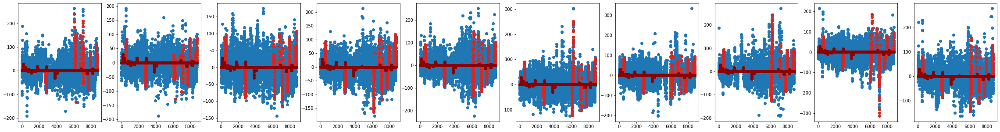

11th additional rbflayer
tensor([[-15.4898,   7.3794,   5.0246,  16.8376,  -7.7074,  16.4997,   5.9951,
          57.9891,  18.0700,  27.3147, -11.5175,   5.0961,  27.7859,   5.4445,
          51.3712, -28.4470, -12.5473,   3.1658, -46.6322, -48.4253]],
       device='cuda:0', dtype=torch.float64)
11th additional RBFlayer 0th epoch loss: 30.40441345810083
11th additional RBFlayer 999th epoch MSE Loss: 27.269258062869746
11th additional RBFlayer 1999th epoch MSE Loss: 27.223025555720323
11th additional RBFlayer 2999th epoch MSE Loss: 27.207171406675688
11th additional RBFlayer best loss : 27.207171406675688


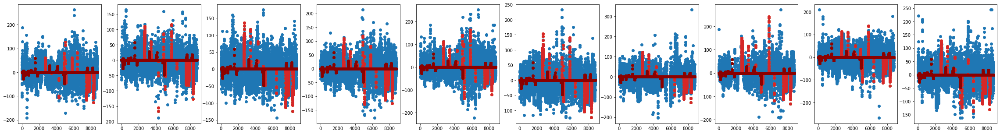

12th additional rbflayer
tensor([[  5.0537,  -4.8352,  -4.4123, -26.3071,  36.2114,   8.9724,  -6.3404,
           5.2327, -31.7321,  10.8154, -13.0962, -36.9575,  -6.1214,  -5.5686,
         -37.6181, -38.9300,  26.7412,  18.4664,  45.1170,  47.2502]],
       device='cuda:0', dtype=torch.float64)
12th additional RBFlayer 0th epoch loss: 26.989568963815913
12th additional RBFlayer 999th epoch MSE Loss: 25.740544895904804
12th additional RBFlayer 1999th epoch MSE Loss: 25.65961402573236
12th additional RBFlayer 2999th epoch MSE Loss: 25.631918530487958
12th additional RBFlayer best loss : 25.631918530487958


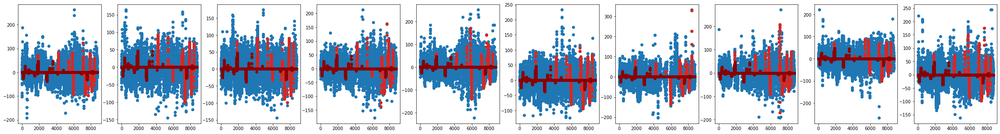

13th additional rbflayer
tensor([[ -9.4492,  11.8838,  25.8843,  -2.6756,   9.5557,  25.9743,   4.8979,
         -27.7044,  12.1582,   7.2240,  38.7542, -28.4043, -10.7792,  18.9745,
         -29.9522, -27.5372,  -6.4506,  59.6396,  32.6387,   6.2619]],
       device='cuda:0', dtype=torch.float64)
13th additional RBFlayer 0th epoch loss: 25.723152340863265
13th additional RBFlayer 999th epoch MSE Loss: 24.781295622311784
13th additional RBFlayer 1999th epoch MSE Loss: 24.696045689867066
13th additional RBFlayer 2999th epoch MSE Loss: 24.660682135492493
13th additional RBFlayer best loss : 24.660682135492493


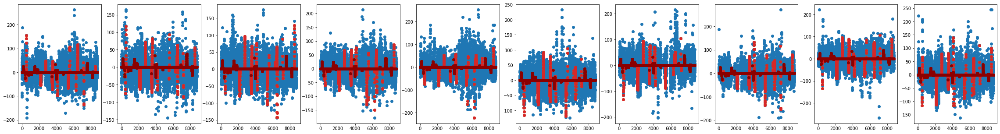

14th additional rbflayer
tensor([[  4.0253, -46.4182,   0.9185,  -7.1820, -41.3027,   4.2431, -12.2981,
         -26.6561,  -6.2951,  18.2259,   9.3055, -22.6021,  15.2151, -21.2424,
          26.7784,  18.7776,   3.7372,  -1.7145,  64.7521, -37.2038]],
       device='cuda:0', dtype=torch.float64)
14th additional RBFlayer 0th epoch loss: 25.605984382514034
14th additional RBFlayer 999th epoch MSE Loss: 23.949440603244238
14th additional RBFlayer 1999th epoch MSE Loss: 23.94045361497285
14th additional RBFlayer 2999th epoch MSE Loss: 23.928617605532327
14th additional RBFlayer best loss : 23.928617605532327


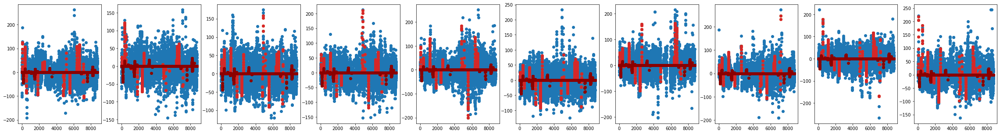

15th additional rbflayer
tensor([[  8.2369, -11.4702,  10.8419,  -3.8608, -18.9064,  15.3509,  25.7085,
           6.6621,   7.1685,  27.6273,  10.9368,  23.9559, -50.9446, -24.8704,
          -7.6532,  -7.1371,  60.2041,  32.9330, -33.9620,  11.4714]],
       device='cuda:0', dtype=torch.float64)
15th additional RBFlayer 0th epoch loss: 24.147884275097518
15th additional RBFlayer 999th epoch MSE Loss: 23.23390463784944
15th additional RBFlayer 1999th epoch MSE Loss: 23.215393820421966
15th additional RBFlayer 2999th epoch MSE Loss: 23.19566054592645
15th additional RBFlayer best loss : 23.19566054592645


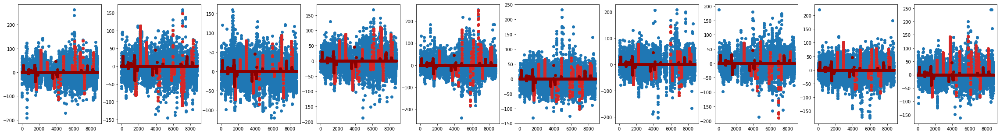

16th additional rbflayer
tensor([[  5.6012,  -5.8130,  -6.6434, -10.2198, -37.9837,   8.3939,  -5.3421,
         -41.5159, -22.5419,  53.9833,  12.4610,   5.2582, -20.5829, -43.2058,
          -9.0161, -15.0623, -60.6501,  17.8180,  55.4980,  10.5004]],
       device='cuda:0', dtype=torch.float64)
16th additional RBFlayer 0th epoch loss: 24.159846543917276
16th additional RBFlayer 999th epoch MSE Loss: 22.298196491348413
16th additional RBFlayer 1999th epoch MSE Loss: 22.247180478892965
16th additional RBFlayer 2999th epoch MSE Loss: 22.222750698836624
16th additional RBFlayer best loss : 22.222750698836624


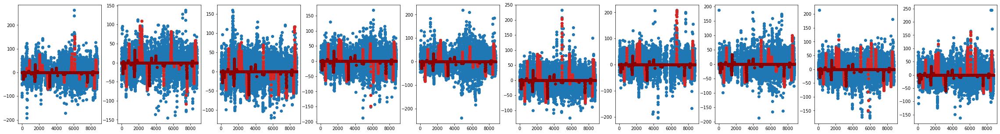

17th additional rbflayer
tensor([[   4.6245,   42.4409,   36.6729,   19.9856,  -13.7012,    6.7503,
           22.7896,  -16.9700,    6.0831,   42.2878,  -10.4456,  -42.0933,
          -22.9536,   -6.3937,   12.3043,   34.1960,   -7.0088,   46.3315,
         -105.8135,   -9.6267]], device='cuda:0', dtype=torch.float64)
17th additional RBFlayer 0th epoch loss: 23.256836455772195
17th additional RBFlayer 999th epoch MSE Loss: 21.853137796762308
17th additional RBFlayer 1999th epoch MSE Loss: 21.773593280146045
17th additional RBFlayer 2999th epoch MSE Loss: 21.747615767105156
17th additional RBFlayer best loss : 21.747615767105156


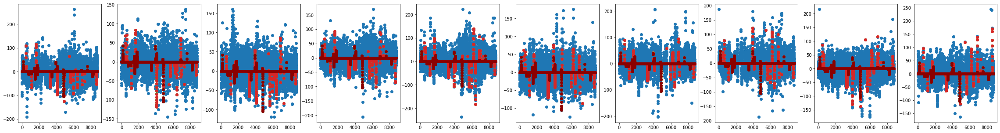

18th additional rbflayer
tensor([[ 14.0467,  19.3317,  10.3063,  -4.2719, -19.6666, -29.6076,  -6.6604,
          22.0079,   8.7097,   5.4251,  35.5284,  -6.4204, -23.2206,  15.2445,
          17.8928,  54.5130,  12.7499,  30.5260,  -6.0142,  59.6364]],
       device='cuda:0', dtype=torch.float64)
18th additional RBFlayer 0th epoch loss: 22.351792873867748
18th additional RBFlayer 999th epoch MSE Loss: 21.074176535882877
18th additional RBFlayer 1999th epoch MSE Loss: 21.037675706879103
18th additional RBFlayer 2999th epoch MSE Loss: 21.01702567078826
18th additional RBFlayer best loss : 21.01702567078826


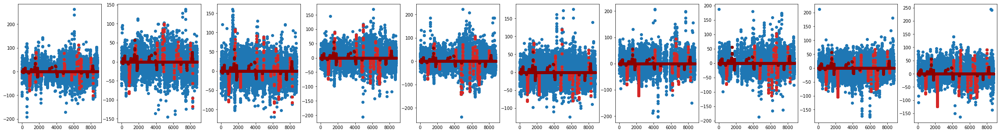

19th additional rbflayer
tensor([[-13.5366, -39.4552,  -3.4456,  -0.1390, -17.1727,  -2.5132,   4.6188,
           7.1302,  39.6456,  -8.3913,  35.9544,  19.8457, -16.8543,  11.2993,
         -18.3914, -14.8954,  -7.2720, -49.8340, -13.4194,  33.7149]],
       device='cuda:0', dtype=torch.float64)
19th additional RBFlayer 0th epoch loss: 21.715149593500882
19th additional RBFlayer 999th epoch MSE Loss: 20.57270262518146
19th additional RBFlayer 1999th epoch MSE Loss: 20.535695248149853
19th additional RBFlayer 2999th epoch MSE Loss: 20.514979817141523
19th additional RBFlayer best loss : 20.514979817141523


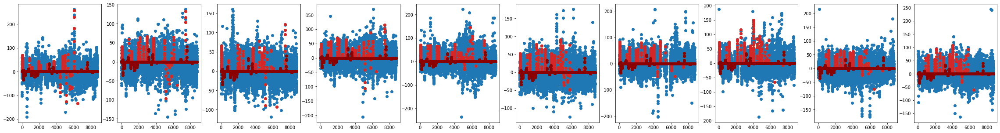

20th additional rbflayer
tensor([[ 29.7411,   3.2603,  20.5348,  21.0607,  19.5219,   6.6788, -22.0433,
          -6.5275, -42.5904,  22.3127, -50.9374,  13.7929, -50.5835, -21.1934,
          64.6503,   4.7452,  12.2559,  34.0380,  47.3233, -35.2165]],
       device='cuda:0', dtype=torch.float64)
20th additional RBFlayer 0th epoch loss: 21.51186306426515
20th additional RBFlayer 999th epoch MSE Loss: 20.107953123591834
20th additional RBFlayer 1999th epoch MSE Loss: 20.025280652659784
20th additional RBFlayer 2999th epoch MSE Loss: 20.00017600443828
20th additional RBFlayer best loss : 20.00017600443828


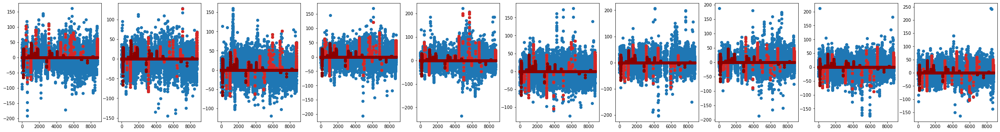

21th additional rbflayer
tensor([[-33.3018,  -3.5516, -18.1779, -20.7275, -21.5560,  -1.7131,  34.3130,
           7.1581,  17.7550,  62.2791,  16.4539, -10.4028,  -9.9088,  11.2125,
         -22.9838,  -7.0587,  12.0872,  34.0378, -18.7201,  18.9478]],
       device='cuda:0', dtype=torch.float64)
21th additional RBFlayer 0th epoch loss: 20.640187075872706
21th additional RBFlayer 999th epoch MSE Loss: 19.560701979475272
21th additional RBFlayer 1999th epoch MSE Loss: 19.514182408610992
21th additional RBFlayer 2999th epoch MSE Loss: 19.49232077204576
21th additional RBFlayer best loss : 19.49232077204576


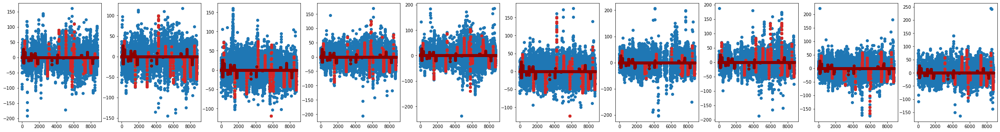

22th additional rbflayer
tensor([[ -6.9538,  27.1814,   9.2545,  18.4999,  -5.3771,   1.8937, -12.4910,
          -6.5274, -42.3971, -11.5829, -16.7138,   5.2473, -16.9175, -19.5345,
          -6.2445,   8.9111,   6.5839, -17.3665,  43.1416,  25.6469]],
       device='cuda:0', dtype=torch.float64)
22th additional RBFlayer 0th epoch loss: 19.68617855404164
22th additional RBFlayer 999th epoch MSE Loss: 18.998010517128012
22th additional RBFlayer 1999th epoch MSE Loss: 18.97059575849457
22th additional RBFlayer 2999th epoch MSE Loss: 18.958310569577208
22th additional RBFlayer best loss : 18.958310569577208


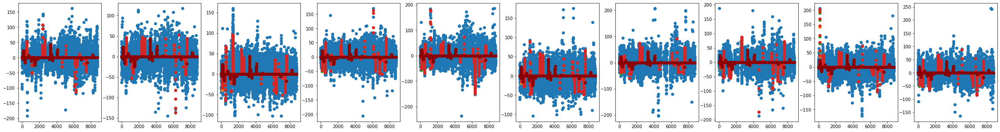

23th additional rbflayer
tensor([[ 16.3720,  11.0019, -28.5599,   4.3198,  12.2782,  -6.5226, -60.4533,
         -13.4777,   6.9413,   6.2688,  16.6895,   6.4907,  20.2464, -50.8554,
          11.8934, -18.1998,  14.4588,  13.5833, -41.0181,  -5.2321]],
       device='cuda:0', dtype=torch.float64)
23th additional RBFlayer 0th epoch loss: 19.16755066370255
23th additional RBFlayer 999th epoch MSE Loss: 18.68250387127677
23th additional RBFlayer 1999th epoch MSE Loss: 18.640077003992918
23th additional RBFlayer 2999th epoch MSE Loss: 18.629173658352563
23th additional RBFlayer best loss : 18.629173658352563


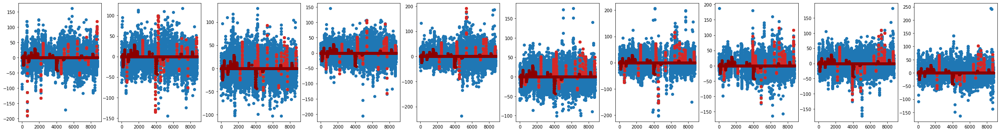

24th additional rbflayer
tensor([[ 13.4415,  16.0052,   3.8521, -17.8737,  -9.5718,  -6.0778,   2.3807,
           2.9198, -23.8242, -25.2291, -16.7628,  -9.5006, -62.9840, -18.4116,
         -56.0075, -58.5931,  12.2224,  18.2600, -28.3162, -56.1385]],
       device='cuda:0', dtype=torch.float64)
24th additional RBFlayer 0th epoch loss: 19.471014551282934
24th additional RBFlayer 999th epoch MSE Loss: 18.283775085371197
24th additional RBFlayer 1999th epoch MSE Loss: 18.24640349831329
24th additional RBFlayer 2999th epoch MSE Loss: 18.239097269547074
24th additional RBFlayer best loss : 18.239097269547074


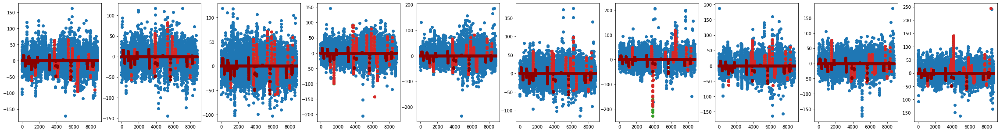

25th additional rbflayer
tensor([[-20.6889,   3.9107,   7.4916,  -6.6698,   4.3376,  -6.6024,  41.3694,
         -67.8532,  11.8410, -35.7052,  27.6482, -14.4044, -43.0276,  14.2587,
          18.6350,  38.9557,  11.1260,  -6.9392,   5.9207,  21.2427]],
       device='cuda:0', dtype=torch.float64)
25th additional RBFlayer 0th epoch loss: 18.532715342547533
25th additional RBFlayer 999th epoch MSE Loss: 17.891449844373078
25th additional RBFlayer 1999th epoch MSE Loss: 17.803440048844468
25th additional RBFlayer 2999th epoch MSE Loss: 17.77676146235682
25th additional RBFlayer best loss : 17.77676146235682


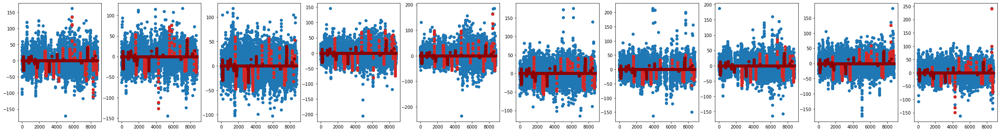

26th additional rbflayer
tensor([[ 16.6234,  41.2577, -10.6877,  -6.6616,  13.7041,   7.1151,   6.9875,
         -40.9506, -37.8747, -21.8065,  -9.9519,   9.4112, -46.5152, -57.9421,
         -18.2093,   5.9601, -22.0860, -11.4963, -39.5191,  -4.2012]],
       device='cuda:0', dtype=torch.float64)
26th additional RBFlayer 0th epoch loss: 18.325845988930947
26th additional RBFlayer 999th epoch MSE Loss: 17.50056921344639
26th additional RBFlayer 1999th epoch MSE Loss: 17.442369962300027
26th additional RBFlayer 2999th epoch MSE Loss: 17.4271504410526
26th additional RBFlayer best loss : 17.4271504410526


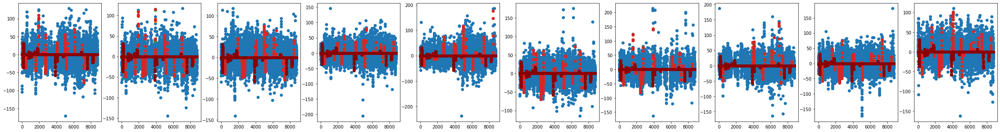

27th additional rbflayer
tensor([[-33.6027, -16.5506,  10.7662, -17.1274,   6.5922,  40.4284,  10.7549,
          -7.2738,  39.2853,  13.1061,  79.9228,  16.7217,  11.0542,  -9.9082,
         -12.3994, -22.7106,  28.0236,  11.3064, -39.4657, -12.2499]],
       device='cuda:0', dtype=torch.float64)
27th additional RBFlayer 0th epoch loss: 17.650694263478513
27th additional RBFlayer 999th epoch MSE Loss: 17.120390451349923
27th additional RBFlayer 1999th epoch MSE Loss: 17.09437509949739
27th additional RBFlayer 2999th epoch MSE Loss: 17.08096485131926
27th additional RBFlayer best loss : 17.08096485131926


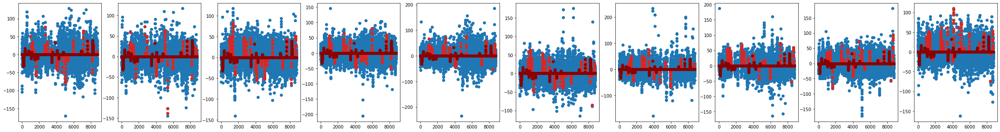

28th additional rbflayer
tensor([[ -3.6875,  12.7022, -15.7854,   5.7170,  -6.6693, -27.8558, -25.7018,
         -15.9313, -28.0218, -14.6974,  20.3235,  -7.9228,  10.2858,  20.5089,
          22.3995,  22.8202,  45.3488,  55.1010, -63.7026,   8.2751]],
       device='cuda:0', dtype=torch.float64)
28th additional RBFlayer 0th epoch loss: 17.907903373104144
28th additional RBFlayer 999th epoch MSE Loss: 16.838918045964434
28th additional RBFlayer 1999th epoch MSE Loss: 16.790204746799358
28th additional RBFlayer 2999th epoch MSE Loss: 16.76830787198078
28th additional RBFlayer best loss : 16.76830787198078


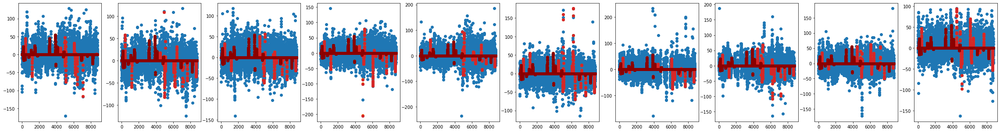

29th additional rbflayer
tensor([[-11.5992,  17.8780,  -9.5649,   2.4464,  -8.2720, -37.1094,   6.6947,
         -22.7565,  26.5339, -21.9002,  11.9235, -23.5748,  -9.9609, -51.5706,
         -24.4981, -49.8287,  14.7426, -13.0546, -16.1088, -34.4900]],
       device='cuda:0', dtype=torch.float64)
29th additional RBFlayer 0th epoch loss: 17.01798283364704
29th additional RBFlayer 999th epoch MSE Loss: 16.34847343373685
29th additional RBFlayer 1999th epoch MSE Loss: 16.28587162596433
29th additional RBFlayer 2999th epoch MSE Loss: 16.257242600777534
29th additional RBFlayer best loss : 16.257242600777534


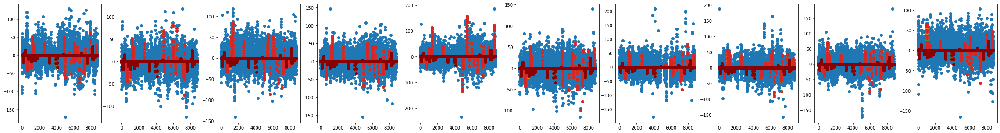

30th additional rbflayer
tensor([[ 32.1943,  12.3790,  62.4172,   6.5036,   3.8080,  42.1129,  10.1257,
           7.6093,  41.6704, -16.7382,  11.4342, -13.9064,  13.7442,   6.7388,
           6.7177,  18.1611,  24.8056,  22.0195, -24.5716, -27.0925]],
       device='cuda:0', dtype=torch.float64)
30th additional RBFlayer 0th epoch loss: 16.543081334359762
30th additional RBFlayer 999th epoch MSE Loss: 16.083131008389895
30th additional RBFlayer 1999th epoch MSE Loss: 15.977708522473195
30th additional RBFlayer 2999th epoch MSE Loss: 15.961308080151042
30th additional RBFlayer best loss : 15.961308080151042


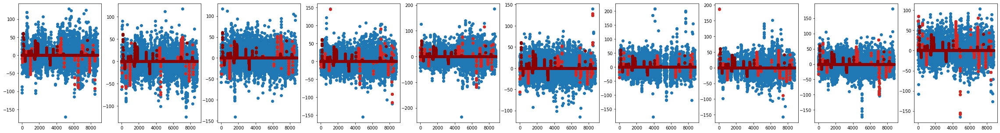

31th additional rbflayer
tensor([[-32.5671,   7.3625,  -5.3270,   9.8333,  21.4452, -15.5295,  10.4271,
         -11.1402, -27.4094, -19.2623,  -8.0567,  14.3362, -70.4137,  16.8560,
         -12.4645,  20.3825, -19.2357,  24.9853,  47.1893, -58.1773]],
       device='cuda:0', dtype=torch.float64)
31th additional RBFlayer 0th epoch loss: 16.30501010126275
31th additional RBFlayer 999th epoch MSE Loss: 15.709335305879012
31th additional RBFlayer 1999th epoch MSE Loss: 15.634123279838898
31th additional RBFlayer 2999th epoch MSE Loss: 15.623034712063058
31th additional RBFlayer best loss : 15.623034712063058


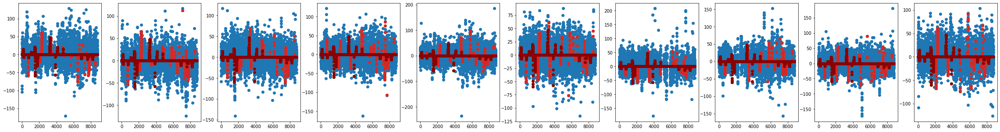

32th additional rbflayer
tensor([[  5.2705,  -9.0964,   7.5290, -17.4328, -19.7068,  35.3963,  -4.8413,
         -28.9246,   4.0250, -23.3102,  -9.9724,  16.7614,   3.5246, -51.7497,
          11.9709,  73.1219,  -6.0150, -15.4899,  59.5798, -32.3677]],
       device='cuda:0', dtype=torch.float64)
32th additional RBFlayer 0th epoch loss: 16.06295497216468
32th additional RBFlayer 999th epoch MSE Loss: 15.41902777432824
32th additional RBFlayer 1999th epoch MSE Loss: 15.36486975781455
32th additional RBFlayer 2999th epoch MSE Loss: 15.349079318552091
32th additional RBFlayer best loss : 15.349079318552091


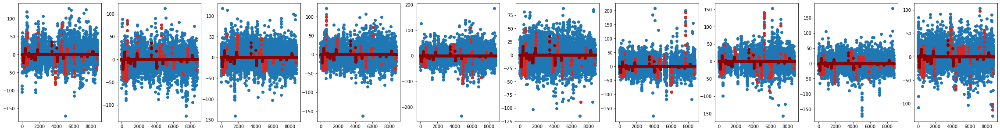

33th additional rbflayer
tensor([[-14.2944,  -4.9878,  48.1869,  12.2991,  -3.0693,   8.0379,   6.4495,
           9.7605,   5.4304,  -4.3754, -14.6650, -45.0265, -12.7380,   5.4397,
          70.6713,  11.9671, -45.2538,  23.3782,  -3.4240,  31.7801]],
       device='cuda:0', dtype=torch.float64)
33th additional RBFlayer 0th epoch loss: 15.792510328590888
33th additional RBFlayer 999th epoch MSE Loss: 15.23677979299587
33th additional RBFlayer 1999th epoch MSE Loss: 15.113087063337451
33th additional RBFlayer 2999th epoch MSE Loss: 15.095790166844132
33th additional RBFlayer best loss : 15.095790166844132


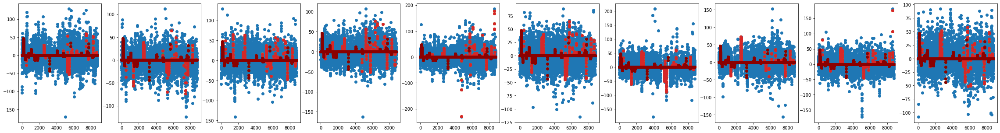

34th additional rbflayer
tensor([[  2.2222, -15.4550,   4.7487, -33.4172,  35.7495,  -4.5935,  -7.0678,
         -32.8209,   7.0975,  -4.2036,  16.4431, -44.0414, -26.5628, -11.8214,
          -6.9962,  13.6123,   5.2517,  -3.6858,  44.4220,  31.1526]],
       device='cuda:0', dtype=torch.float64)
34th additional RBFlayer 0th epoch loss: 15.486272337679925
34th additional RBFlayer 999th epoch MSE Loss: 14.955811935858105
34th additional RBFlayer 1999th epoch MSE Loss: 14.899094677642138
34th additional RBFlayer 2999th epoch MSE Loss: 14.885637878088879
34th additional RBFlayer best loss : 14.885637878088879


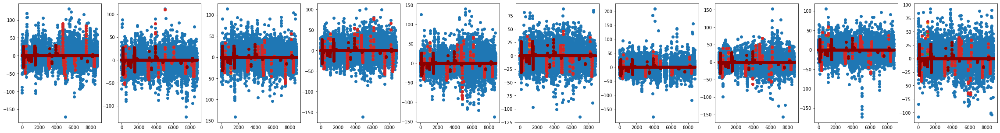

35th additional rbflayer
tensor([[  8.7594,  -2.3430,   6.3245,  -6.8857,  21.8823, -50.9715, -15.7006,
           6.3610, -18.3626, -24.3706,   7.3714, 112.5603,  16.7033,  22.8030,
         -25.4653,  33.7857,  -3.7490,   6.5604, -22.5268,   5.9927]],
       device='cuda:0', dtype=torch.float64)
35th additional RBFlayer 0th epoch loss: 15.420101119646224
35th additional RBFlayer 999th epoch MSE Loss: 14.703658339313417
35th additional RBFlayer 1999th epoch MSE Loss: 14.639118631846808
35th additional RBFlayer 2999th epoch MSE Loss: 14.62178086367492
35th additional RBFlayer best loss : 14.62178086367492


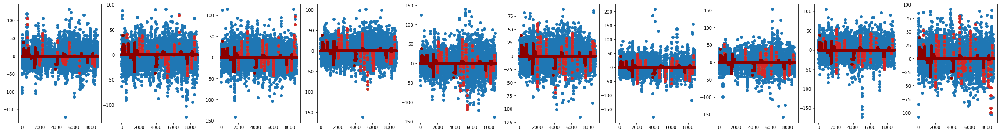

36th additional rbflayer
tensor([[-11.7900,  24.3916, -19.8875,  13.3244,  -9.7604,  -6.3453,  53.5887,
          -6.9970, -12.5278, -16.7907, -10.1429,  24.0794, -25.9858,  32.2013,
          -7.5539,  -7.0834,  13.4274,  32.1095, -23.2326,  36.4592]],
       device='cuda:0', dtype=torch.float64)
36th additional RBFlayer 0th epoch loss: 14.814452947497283
36th additional RBFlayer 999th epoch MSE Loss: 14.376271821040312
36th additional RBFlayer 1999th epoch MSE Loss: 14.340275206378555
36th additional RBFlayer 2999th epoch MSE Loss: 14.319655281512427
36th additional RBFlayer best loss : 14.319655281512427


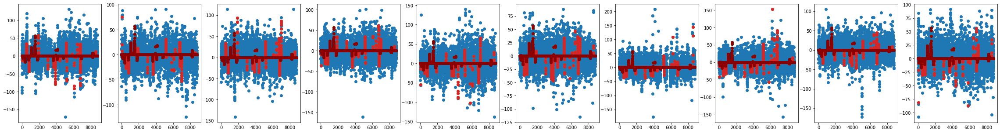

37th additional rbflayer
tensor([[ 10.8773,  -9.0581,  -8.3933,  15.1344,  24.0115,  -4.1211,   7.9520,
         -33.8828, -10.7900,   6.4656,  41.5131,  23.6322, -71.5732,  11.3308,
          -7.8924, -63.8956,  12.0161,  13.3032,   6.5848, -21.8755]],
       device='cuda:0', dtype=torch.float64)
37th additional RBFlayer 0th epoch loss: 14.860888745951096
37th additional RBFlayer 999th epoch MSE Loss: 14.165517799705288
37th additional RBFlayer 1999th epoch MSE Loss: 14.085990106722706
37th additional RBFlayer 2999th epoch MSE Loss: 14.077442631319528
37th additional RBFlayer best loss : 14.077442631319528


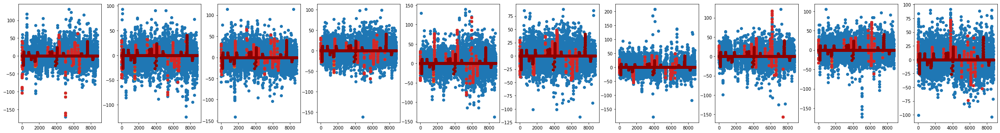

38th additional rbflayer
tensor([[  2.1041,   3.7265, -14.1506, -12.6014,   5.4858, -21.6615,  -7.1642,
         -42.2230,  23.6503,   7.3721,   9.1376, -58.6187, -22.7306,  -5.2292,
          -7.3949,   9.2215,  59.5800,  39.1803, -19.0781,  16.4252]],
       device='cuda:0', dtype=torch.float64)
38th additional RBFlayer 0th epoch loss: 14.51293702127494
38th additional RBFlayer 999th epoch MSE Loss: 13.92740842288539
38th additional RBFlayer 1999th epoch MSE Loss: 13.861928404335016
38th additional RBFlayer 2999th epoch MSE Loss: 13.853440117686299
38th additional RBFlayer best loss : 13.853440117686299


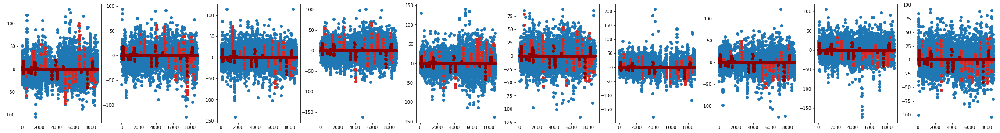

39th additional rbflayer
tensor([[-37.7843,  11.5718,  -4.3504, -12.3483,  13.6799, -12.1103,   6.3227,
          41.0132, -22.4520, -13.5638,  14.8313,  30.0348,  -8.9787,  16.7803,
          -4.5015,  -9.1108, -65.6676, -18.6754, -12.0437,  11.0029]],
       device='cuda:0', dtype=torch.float64)
39th additional RBFlayer 0th epoch loss: 14.659159724598343
39th additional RBFlayer 999th epoch MSE Loss: 13.749421838480622
39th additional RBFlayer 1999th epoch MSE Loss: 13.679806565745453
39th additional RBFlayer 2999th epoch MSE Loss: 13.66597841198125
39th additional RBFlayer best loss : 13.66597841198125


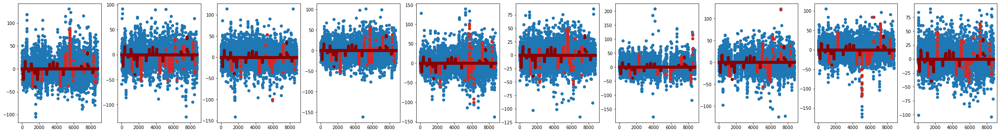

40th additional rbflayer
tensor([[  6.6207,   7.8083,  28.7659,   5.9017,   7.3114,  27.7130, -19.0361,
         -27.5111,  -5.9287,   6.6960,  11.1977, -13.0338, -29.5684,  -8.4395,
           5.8408,  -7.4411, -37.7754,  18.6071, -29.1562, -20.3884]],
       device='cuda:0', dtype=torch.float64)
40th additional RBFlayer 0th epoch loss: 13.809659394151199
40th additional RBFlayer 999th epoch MSE Loss: 13.541298620568394
40th additional RBFlayer 1999th epoch MSE Loss: 13.49263818555009
40th additional RBFlayer 2999th epoch MSE Loss: 13.475600237640007
40th additional RBFlayer best loss : 13.475600237640007


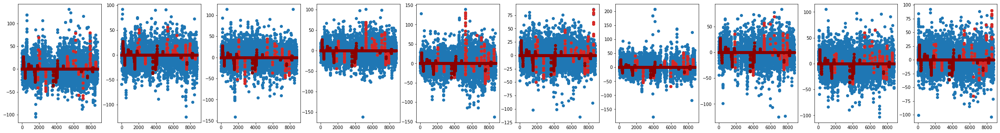

41th additional rbflayer
tensor([[  4.9406,  -9.3089,   4.1066, -34.1566,  17.5779,  -6.5708, -13.9221,
           5.4292,  33.9582,  -8.3013,  18.1451,  62.0300,   8.3673,  -0.5620,
         -22.5915, -90.8274,  -8.5758,  -9.4873,  43.4839, -31.6889]],
       device='cuda:0', dtype=torch.float64)
41th additional RBFlayer 0th epoch loss: 14.300893828466226
41th additional RBFlayer 999th epoch MSE Loss: 13.258680931340336
41th additional RBFlayer 1999th epoch MSE Loss: 13.198432367682754
41th additional RBFlayer 2999th epoch MSE Loss: 13.19112180377677
41th additional RBFlayer best loss : 13.19112180377677


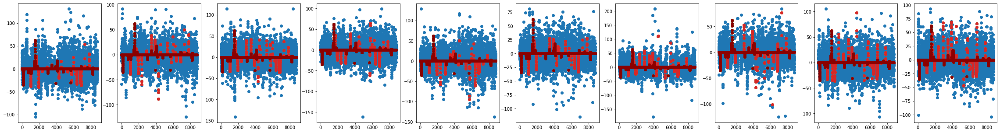

42th additional rbflayer
tensor([[ 13.7228,   9.8426,  22.9134,   6.6569,  -6.4279,  41.8867,  -7.9369,
          -7.0648,  13.3330,  19.0904, -16.8465,  14.1417,  12.2988,  -6.0137,
          -6.9073,   8.2619, -13.8829,  22.7538, -31.2067,  50.8039]],
       device='cuda:0', dtype=torch.float64)
42th additional RBFlayer 0th epoch loss: 13.473019787516717
42th additional RBFlayer 999th epoch MSE Loss: 13.174871718991678
42th additional RBFlayer 1999th epoch MSE Loss: 13.063427468782569
42th additional RBFlayer 2999th epoch MSE Loss: 13.045600661908004
42th additional RBFlayer best loss : 13.045600661908004


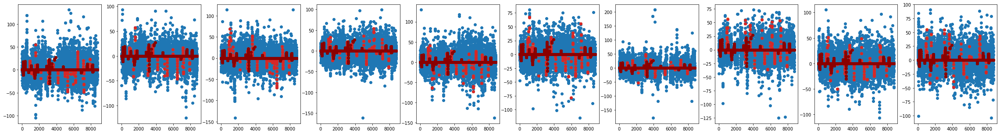

43th additional rbflayer
tensor([[-17.4178,  -5.1130, -26.4614, -19.2275,  26.2460,  23.2177,  -8.6031,
           6.4455, -32.2555, -10.8413, -16.5181,   9.5399,  19.0066, -50.5695,
         -22.8581,   6.4926,  14.9922, -18.3314,  44.7745,  25.8995]],
       device='cuda:0', dtype=torch.float64)
43th additional RBFlayer 0th epoch loss: 13.29742642571621
43th additional RBFlayer 999th epoch MSE Loss: 12.964602534135942
43th additional RBFlayer 1999th epoch MSE Loss: 12.876223084122733
43th additional RBFlayer 2999th epoch MSE Loss: 12.845473724284638
43th additional RBFlayer best loss : 12.845473724284638


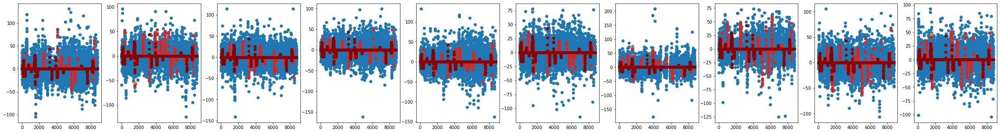

44th additional rbflayer
tensor([[  6.3511,   5.6906,  35.4691,  18.8518,  11.3404, -19.3871, -15.8579,
         -32.6694, -18.1054,  -7.1146,  41.9950,   1.8065, -10.3179,  33.3693,
          -8.1471,  44.5515,  -7.3572,  34.3052,  -8.3995, -27.5318]],
       device='cuda:0', dtype=torch.float64)
44th additional RBFlayer 0th epoch loss: 13.156491254698075
44th additional RBFlayer 999th epoch MSE Loss: 12.800309864993638
44th additional RBFlayer 1999th epoch MSE Loss: 12.719071591371355
44th additional RBFlayer 2999th epoch MSE Loss: 12.699671010335996
44th additional RBFlayer best loss : 12.699671010335996


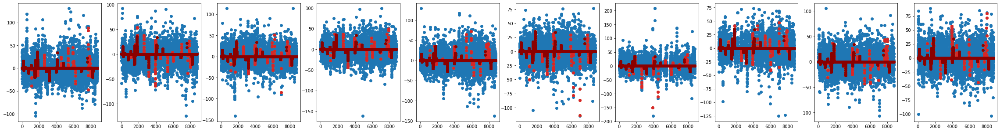

45th additional rbflayer
tensor([[ -6.8780,  -5.3179,  -9.5917,  11.0073,  14.7340, -26.9013,  22.3183,
         -23.3079,  15.5018,  14.9612,  11.3867, -10.5817,  -7.8746,  19.5553,
           6.6064,   7.6499, -34.1899,  66.4705,  14.5430,  27.9096]],
       device='cuda:0', dtype=torch.float64)
45th additional RBFlayer 0th epoch loss: 13.117290783676193
45th additional RBFlayer 999th epoch MSE Loss: 12.629808028828487
45th additional RBFlayer 1999th epoch MSE Loss: 12.57405151554215
45th additional RBFlayer 2999th epoch MSE Loss: 12.557833791582352
45th additional RBFlayer best loss : 12.557833791582352


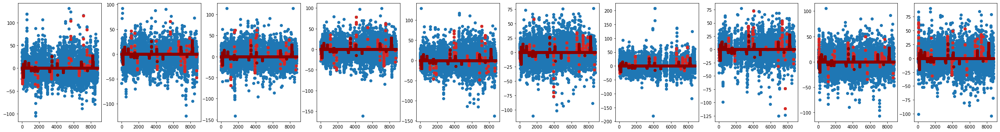

46th additional rbflayer
tensor([[  6.1778, -25.6802,  24.6101, -26.9863,  -1.4499, -10.0244,  24.8853,
          24.6782, -36.0241, -14.6435, -10.1808,  12.9688,   9.6851, -51.0277,
         -67.4164,  -7.3452,  13.3323,   3.3060, -36.7625, -15.5170]],
       device='cuda:0', dtype=torch.float64)
46th additional RBFlayer 0th epoch loss: 13.145729839313617
46th additional RBFlayer 999th epoch MSE Loss: 12.621159462345817
46th additional RBFlayer 1999th epoch MSE Loss: 12.49767863842731
46th additional RBFlayer 2999th epoch MSE Loss: 12.483456028797065
46th additional RBFlayer best loss : 12.483456028797065


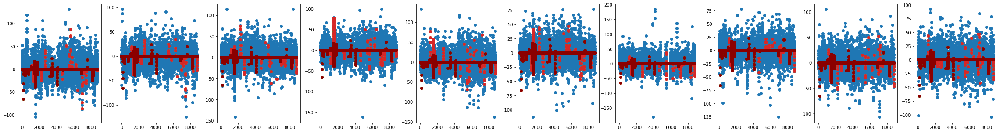

47th additional rbflayer
tensor([[  7.5363,  -9.2577, -27.4138,  14.6166,  10.7839,  23.2085,  -6.1220,
           8.4253,  -5.0757, -37.5079,  14.5573,  52.3447,  31.0377, -22.7352,
          18.0579, -25.4791,  -5.8591,  16.7293,  21.1772,  15.7793]],
       device='cuda:0', dtype=torch.float64)
47th additional RBFlayer 0th epoch loss: 12.907819698966735
47th additional RBFlayer 999th epoch MSE Loss: 12.389000656487461
47th additional RBFlayer 1999th epoch MSE Loss: 12.325781405203859
47th additional RBFlayer 2999th epoch MSE Loss: 12.314243591814357
47th additional RBFlayer best loss : 12.314243591814357


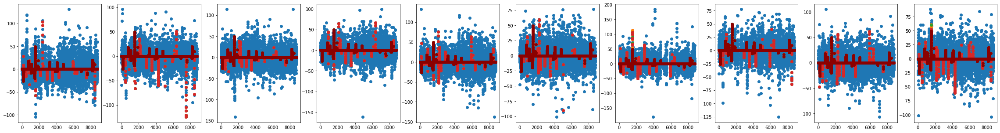

48th additional rbflayer
tensor([[ -4.9772,   7.6952, -12.4775,  21.0123,  -9.3905,  20.9386, -55.6009,
           6.2829, -25.2499, -19.6949,  14.6877,  11.6824, -17.6470,  10.8601,
         -18.5821,  11.8473, -10.6427, -19.9406, -50.2600,  18.0201]],
       device='cuda:0', dtype=torch.float64)
48th additional RBFlayer 0th epoch loss: 12.79514805545214
48th additional RBFlayer 999th epoch MSE Loss: 12.282185545892792
48th additional RBFlayer 1999th epoch MSE Loss: 12.190064793249533
48th additional RBFlayer 2999th epoch MSE Loss: 12.151765600073825
48th additional RBFlayer best loss : 12.151765600073825


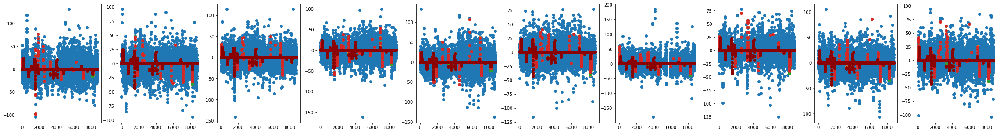

49th additional rbflayer
tensor([[ -7.7838, -18.4669, -17.3226, -32.4661,   7.6251,   7.2887,  46.2929,
          -5.8928,  11.4455,  14.8265,  11.6721, -23.7122,  43.5931, -12.3712,
          -6.8017, -21.2136,   6.5135, -10.6283,  26.7842,  44.3300]],
       device='cuda:0', dtype=torch.float64)
49th additional RBFlayer 0th epoch loss: 12.66896690560548
49th additional RBFlayer 999th epoch MSE Loss: 12.089012090727097
49th additional RBFlayer 1999th epoch MSE Loss: 11.977152963063475
49th additional RBFlayer 2999th epoch MSE Loss: 11.964151419736611
49th additional RBFlayer best loss : 11.964151419736611


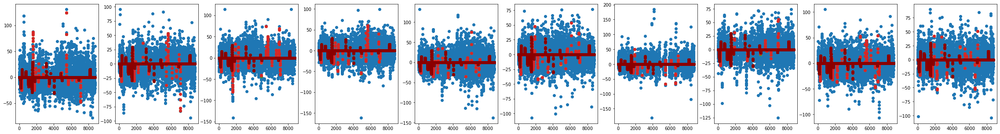

50th additional rbflayer
tensor([[ 10.9622,  22.5262,  18.3554,  22.2507,  26.5308,  24.4419,  30.0964,
         -14.7923, -10.1585,  10.0556,  69.9428,  20.6223,  -7.3080,  22.2623,
          17.6116,  -9.3253,  22.5767,  -7.7145,  16.5105, -62.5420]],
       device='cuda:0', dtype=torch.float64)
50th additional RBFlayer 0th epoch loss: 12.337343070222861
50th additional RBFlayer 999th epoch MSE Loss: 11.977687828409229
50th additional RBFlayer 1999th epoch MSE Loss: 11.825035195768882
50th additional RBFlayer 2999th epoch MSE Loss: 11.79874766120767
50th additional RBFlayer best loss : 11.79874766120767


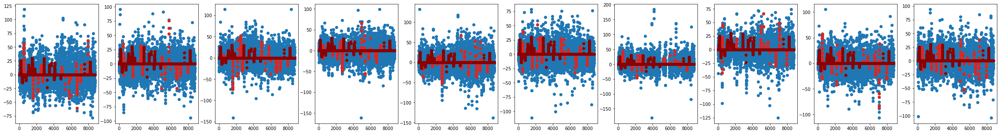

51th additional rbflayer
tensor([[  7.7236,  -7.8059, -30.8269, -27.8874, -16.1227, -12.4905,  -0.8704,
           8.2417,   5.2273, -39.7264, -19.0100, -23.6880,  48.0999,  14.8283,
         -16.9117, -55.3316, -17.1718, -14.7834, -21.5236,  16.6165]],
       device='cuda:0', dtype=torch.float64)
51th additional RBFlayer 0th epoch loss: 12.181002546993627
51th additional RBFlayer 999th epoch MSE Loss: 11.739099206984898
51th additional RBFlayer 1999th epoch MSE Loss: 11.642367775100539
51th additional RBFlayer 2999th epoch MSE Loss: 11.62735792811586
51th additional RBFlayer best loss : 11.62735792811586


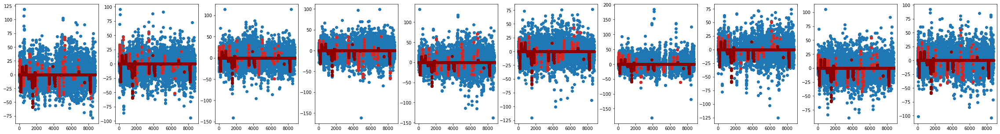

52th additional rbflayer
tensor([[  4.9127, -25.2175,  43.7214,   7.7556,  18.1370,  18.7399,   7.3049,
          12.4858,  -4.7331,  -5.9942, -25.2508, -26.4729,  41.3593, -16.6849,
         -15.0891,  20.7882,  61.1710,  22.7213,  -7.7032,   9.9436]],
       device='cuda:0', dtype=torch.float64)
52th additional RBFlayer 0th epoch loss: 12.164014519938204
52th additional RBFlayer 999th epoch MSE Loss: 11.580917514902326
52th additional RBFlayer 1999th epoch MSE Loss: 11.484606428443156
52th additional RBFlayer 2999th epoch MSE Loss: 11.465150883283243
52th additional RBFlayer best loss : 11.465150883283243


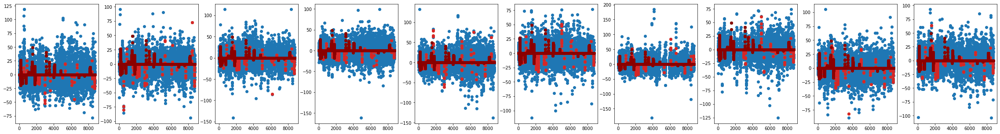

53th additional rbflayer
tensor([[  5.3765, -26.5922,  -5.5446,  26.9733, -17.0968,  -7.8326,  -5.8272,
           4.3021, -22.7121, -25.5937,  11.3033, -20.1153, -14.3959,  32.9165,
           5.6443, -10.6394, -19.3378,  33.8167,  17.2903,  57.8468]],
       device='cuda:0', dtype=torch.float64)
53th additional RBFlayer 0th epoch loss: 11.88259008296907
53th additional RBFlayer 999th epoch MSE Loss: 11.47119185954391
53th additional RBFlayer 1999th epoch MSE Loss: 11.368112655223886
53th additional RBFlayer 2999th epoch MSE Loss: 11.315337365535298
53th additional RBFlayer best loss : 11.315337365535298


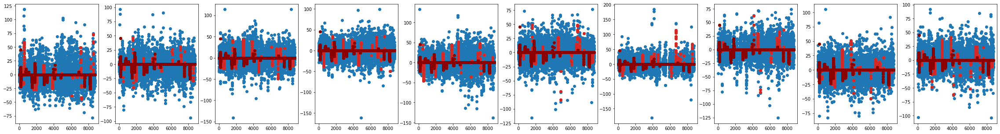

54th additional rbflayer
tensor([[ -5.2777,  15.8351, -23.7671,   7.8808,  23.5746, -14.7793,   2.3454,
          -6.3805,  41.6654,   3.8068,  16.5826,  62.2614, -31.5775, -23.0998,
         -21.7514,  -7.4369,  15.5670, -22.4342,  29.2865,  22.8692]],
       device='cuda:0', dtype=torch.float64)
54th additional RBFlayer 0th epoch loss: 11.805131218586252
54th additional RBFlayer 999th epoch MSE Loss: 11.295020779182824
54th additional RBFlayer 1999th epoch MSE Loss: 11.232729952726613
54th additional RBFlayer 2999th epoch MSE Loss: 11.197403752383643
54th additional RBFlayer best loss : 11.197403752383643


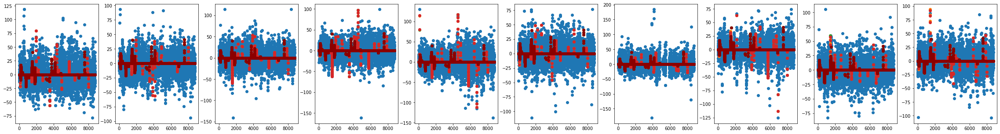

55th additional rbflayer
tensor([[-18.7557, -13.5600,  25.8000,   7.4304,  29.1309,  20.7074, -14.3266,
         -28.4742, -35.8806,   5.3914, -42.4142, -11.1041,   4.5144, -19.1321,
         -42.3374,  11.6657, -43.3575, -13.7065, -33.4287,  17.1863]],
       device='cuda:0', dtype=torch.float64)
55th additional RBFlayer 0th epoch loss: 11.661865178353633
55th additional RBFlayer 999th epoch MSE Loss: 11.28051442103686
55th additional RBFlayer 1999th epoch MSE Loss: 11.17770639116431
55th additional RBFlayer 2999th epoch MSE Loss: 11.124232903310293
55th additional RBFlayer best loss : 11.124232903310293


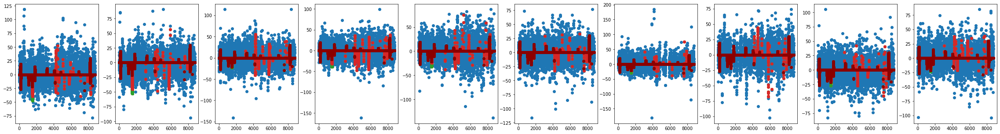

56th additional rbflayer
tensor([[ -9.5149,  22.6020,  25.0126, -14.8217,   7.9113,  -6.7286,  21.5927,
          -6.3490, -13.3539,   6.9800,  -3.9900,  16.4772,  15.0771,  42.1410,
          11.9645,   0.5159,  14.4744,   5.1990, -32.7119,   3.4192]],
       device='cuda:0', dtype=torch.float64)
56th additional RBFlayer 0th epoch loss: 11.699969060684776
56th additional RBFlayer 999th epoch MSE Loss: 11.144790912721197
56th additional RBFlayer 1999th epoch MSE Loss: 11.01332324138018
56th additional RBFlayer 2999th epoch MSE Loss: 10.984694834445206
56th additional RBFlayer best loss : 10.984694834445206


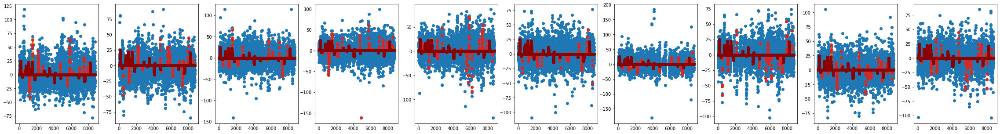

57th additional rbflayer
tensor([[ -7.1067,  19.4921,  25.2886,  -9.5837,   2.3007,  11.9676,   6.2020,
          42.1026,   3.9016,   6.6848, -18.3705,  35.8779, -11.6622,  -8.6139,
         -16.1245,  -9.0525, -22.5920,  16.0278,  49.6956, -22.3827]],
       device='cuda:0', dtype=torch.float64)
57th additional RBFlayer 0th epoch loss: 11.599259896749537
57th additional RBFlayer 999th epoch MSE Loss: 11.003179118321997
57th additional RBFlayer 1999th epoch MSE Loss: 10.882936015153414
57th additional RBFlayer 2999th epoch MSE Loss: 10.855579991421862
57th additional RBFlayer best loss : 10.855579991421862


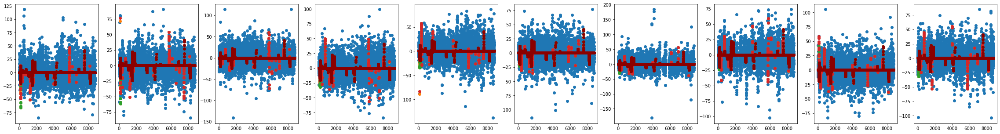

58th additional rbflayer
tensor([[-11.9106,   4.7134, -30.8832,  10.4687,  17.4536,   3.5316,  -7.2404,
         -39.3507,  48.0937, -10.0279,  21.9853,   9.8364,  15.8618,  31.2655,
          19.7880,  19.2547, -12.8121, -37.5816, -18.2623, -30.2855]],
       device='cuda:0', dtype=torch.float64)
58th additional RBFlayer 0th epoch loss: 11.48833253769629
58th additional RBFlayer 999th epoch MSE Loss: 10.969004888776057
58th additional RBFlayer 1999th epoch MSE Loss: 10.758980929751353
58th additional RBFlayer 2999th epoch MSE Loss: 10.725978663962412
58th additional RBFlayer best loss : 10.725978663962412


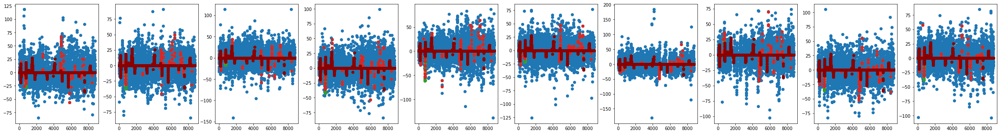

59th additional rbflayer
tensor([[ -5.4411,  -5.1344,  -7.8025, -12.4626, -20.8783,  -6.6359,  16.1286,
         -34.2144,  15.7725,  40.0471, -16.3352,  12.0949, -21.4707, -59.3298,
          14.3810, -20.2052, -10.1368,  -8.0508,  45.2497, -30.9165]],
       device='cuda:0', dtype=torch.float64)
59th additional RBFlayer 0th epoch loss: 11.02795218136257
59th additional RBFlayer 999th epoch MSE Loss: 10.691459569152748
59th additional RBFlayer 1999th epoch MSE Loss: 10.625106704134781
59th additional RBFlayer 2999th epoch MSE Loss: 10.606030886349645
59th additional RBFlayer best loss : 10.606030886349645


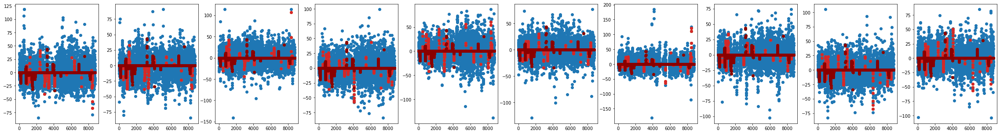

60th additional rbflayer
tensor([[ 11.8073,  10.0199,  47.3159,   7.6949, -18.7022,  -6.9022, -15.8261,
         -18.6658,   6.8246,  23.7484,  12.9912,  -8.3407,  20.2358, -54.4081,
          12.3762, -20.4768, -22.9881,   6.1652,  10.2317, -34.8237]],
       device='cuda:0', dtype=torch.float64)
60th additional RBFlayer 0th epoch loss: 10.985796403924036
60th additional RBFlayer 999th epoch MSE Loss: 10.653184495462511
60th additional RBFlayer 1999th epoch MSE Loss: 10.526101251399659
60th additional RBFlayer 2999th epoch MSE Loss: 10.489659038978866
60th additional RBFlayer best loss : 10.489659038978866


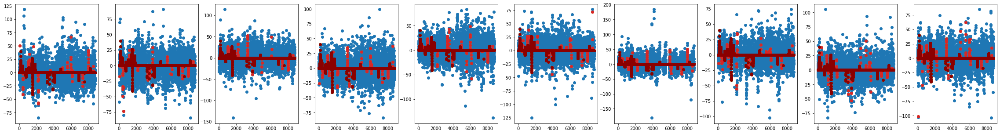

61th additional rbflayer
tensor([[ -9.3205, -26.9537,  18.3787,  -8.5631,  -4.9497, -25.4570, -27.1909,
           6.1719,  26.8451,  23.9174, -18.0547,  21.2952,  -3.8041, -16.7226,
           9.8415, -22.6623,  47.9723,  21.3879, -14.1862, -20.2583]],
       device='cuda:0', dtype=torch.float64)
61th additional RBFlayer 0th epoch loss: 11.025350165289376
61th additional RBFlayer 999th epoch MSE Loss: 10.623593806035402
61th additional RBFlayer 1999th epoch MSE Loss: 10.431722869311448
61th additional RBFlayer 2999th epoch MSE Loss: 10.361901397368111
61th additional RBFlayer best loss : 10.361901397368111


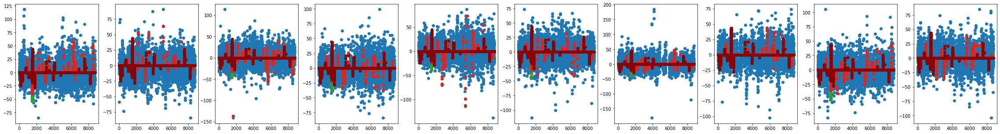

62th additional rbflayer
tensor([[  9.8409,  12.4271,  31.2673, -18.7364,   6.6409,  16.9914,  -7.1385,
         -42.1253,  20.5091,  16.8042, -41.5247,  24.7750,  16.9860, -22.6472,
          -7.0744, -16.9176, -19.2912,  25.1883,  18.0565,  44.3879]],
       device='cuda:0', dtype=torch.float64)
62th additional RBFlayer 0th epoch loss: 10.72825128568352
62th additional RBFlayer 999th epoch MSE Loss: 10.382229769792435
62th additional RBFlayer 1999th epoch MSE Loss: 10.284823006233632
62th additional RBFlayer 2999th epoch MSE Loss: 10.245667803137968
62th additional RBFlayer best loss : 10.245667803137968


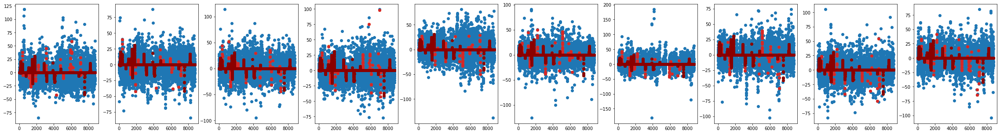

63th additional rbflayer
tensor([[ -8.3650,  -9.3219,  26.6166,   2.4017,  -6.6383,  16.3541,   6.3768,
          42.4965,   3.1596, -31.8066,  16.3619,  43.6791,   1.9289,   6.4497,
          -7.4623,  31.9471,  -8.3691, -22.9102, -27.3513,  30.4233]],
       device='cuda:0', dtype=torch.float64)
63th additional RBFlayer 0th epoch loss: 10.578635191817407
63th additional RBFlayer 999th epoch MSE Loss: 10.2442026425542
63th additional RBFlayer 1999th epoch MSE Loss: 10.163128092038468
63th additional RBFlayer 2999th epoch MSE Loss: 10.126836954539302
63th additional RBFlayer best loss : 10.126836954539302


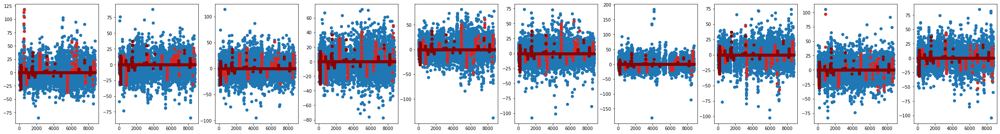

64th additional rbflayer
tensor([[ 15.7854,  15.4555, -12.3008,  15.6739,  10.4169,  -7.9206,  10.3868,
          35.8432,  -7.1607, -23.2259, -12.1399, -25.0563,  -8.9493, -51.9127,
         -31.9417, -22.9787, -19.0350, -30.2757, -30.9162,  32.7854]],
       device='cuda:0', dtype=torch.float64)
64th additional RBFlayer 0th epoch loss: 10.768280887674768
64th additional RBFlayer 999th epoch MSE Loss: 10.304119262815542
64th additional RBFlayer 1999th epoch MSE Loss: 10.127526433055118
64th additional RBFlayer 2999th epoch MSE Loss: 10.08210754877996
64th additional RBFlayer best loss : 10.08210754877996


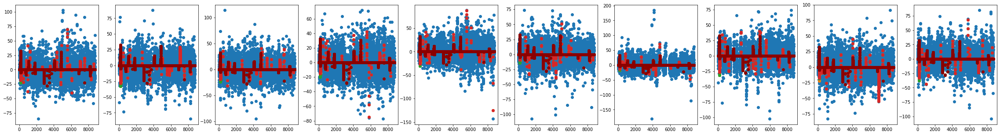

65th additional rbflayer
tensor([[  4.1845, -13.9276,   4.1109,   9.8979, -10.0784,  26.0817,   6.3485,
          42.0377, -16.6220,   9.8402, -10.5579, -51.9127,   8.1808,  24.3353,
         -18.9649,  26.6771, -17.8876, -16.4482, -37.1515,   9.4573]],
       device='cuda:0', dtype=torch.float64)
65th additional RBFlayer 0th epoch loss: 10.447704390048164
65th additional RBFlayer 999th epoch MSE Loss: 10.083505938403855
65th additional RBFlayer 1999th epoch MSE Loss: 9.990937939323722
65th additional RBFlayer 2999th epoch MSE Loss: 9.955661540807533
65th additional RBFlayer best loss : 9.955661540807533
change lr  0.1
----------------------------------------------


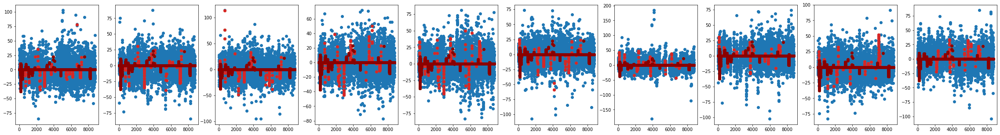

In [32]:
model = MSMRBFNN(10, 20, device)
model.train(input, target, 3000, 1e-2, 10, 10, 0.2)

In [33]:
real = pd.read_csv("./dataset/pm25_ground.txt").drop(['datetime'], axis = 1)
real = real[real.columns[:10]].reset_index(drop=True)
real_target = torch.tensor(real.values).T.to(device).reshape(10,len(real))
real_missing = torch.where(real_target.isnan(), 0.0, 1.0)

In [34]:
missing_index = torch.where(real_target.isnan(), 0.0, 1.0) - torch.where(target.isnan(), 0.0, 1.0)

In [35]:
pred_ = model.pred(input)[1]

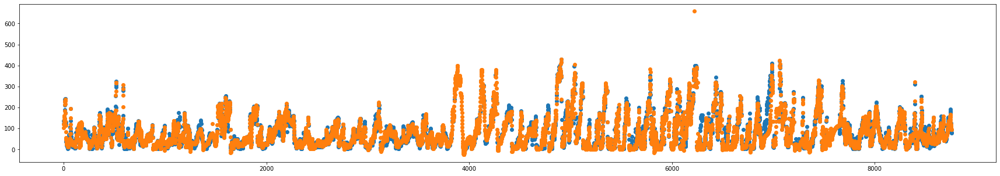

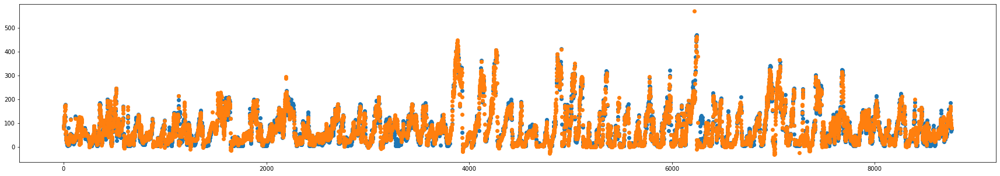

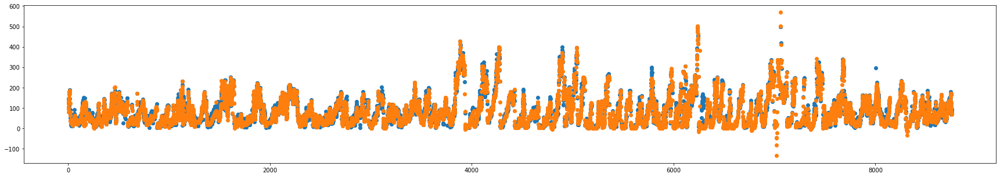

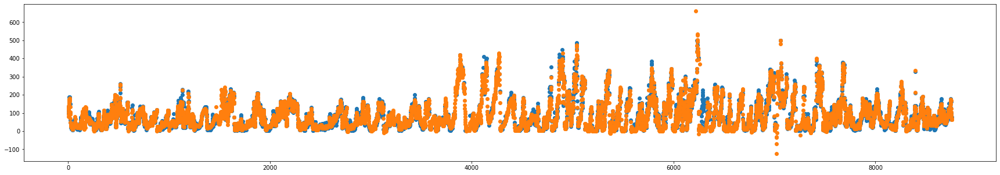

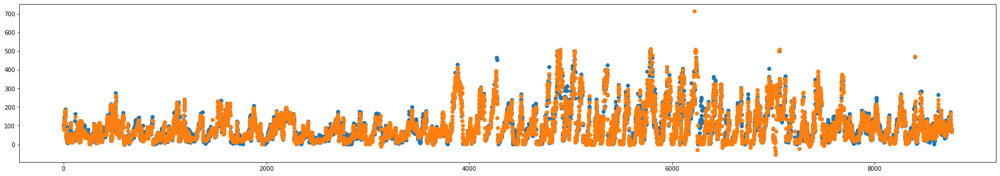

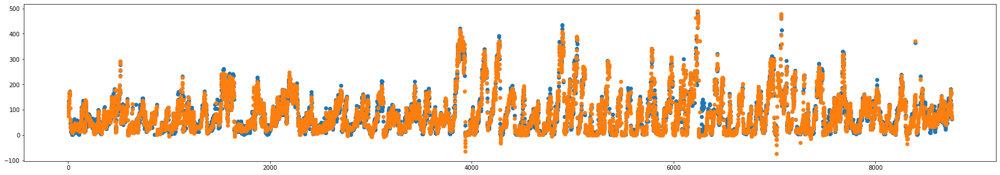

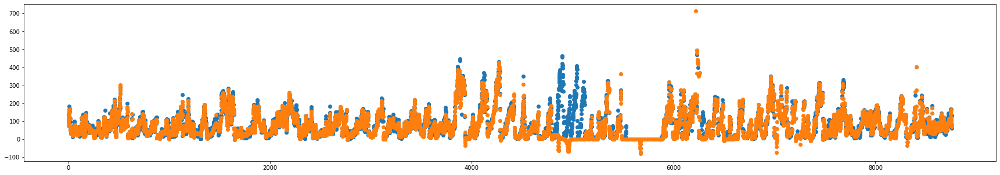

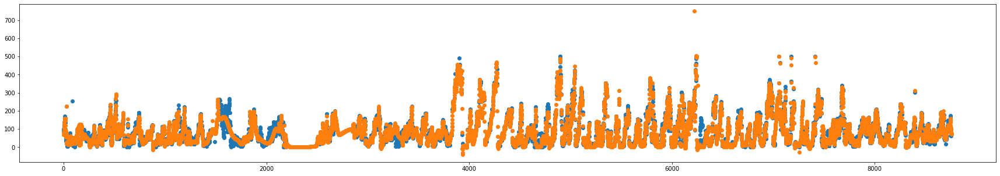

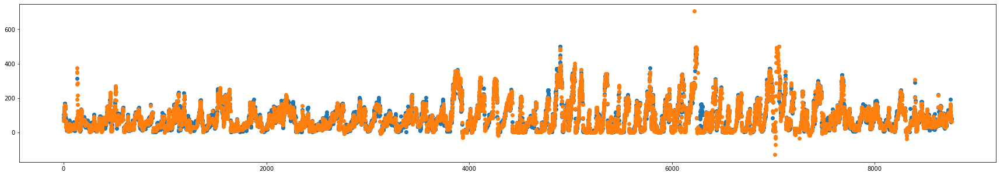

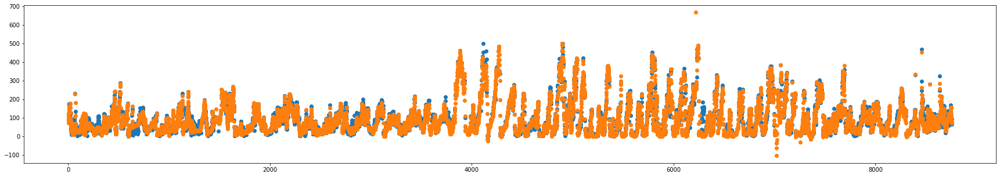

In [36]:
for i in range(10):
    plt.figure(figsize=(30,5))
    plt.scatter(input.cpu().detach().numpy(), real_target[i].cpu().detach().numpy())
    plt.scatter(input.cpu().detach().numpy(), pred_[i].cpu().detach().numpy())

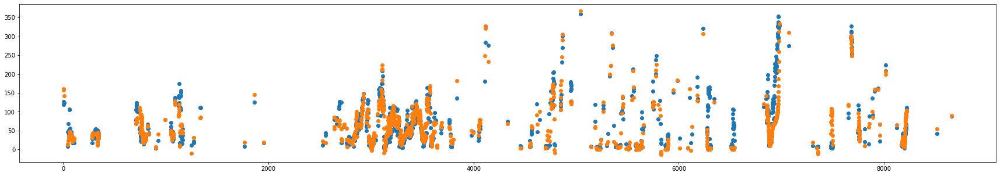

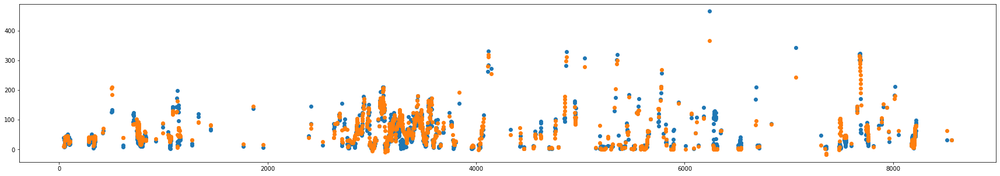

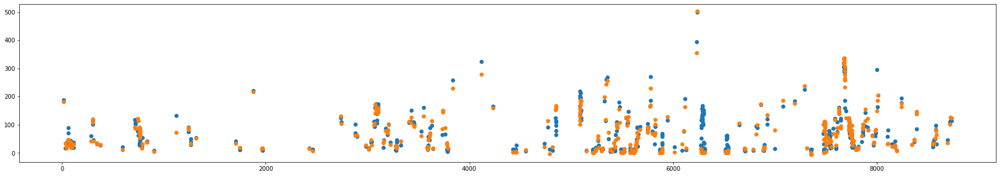

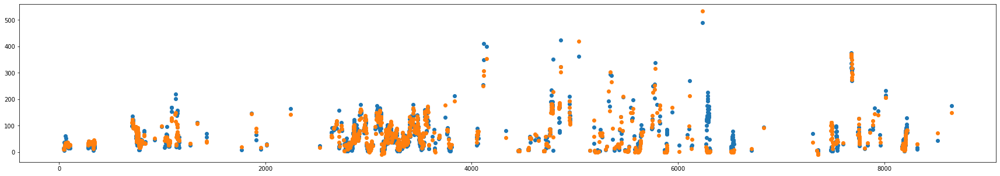

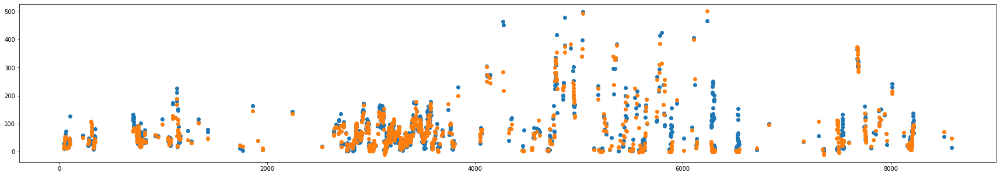

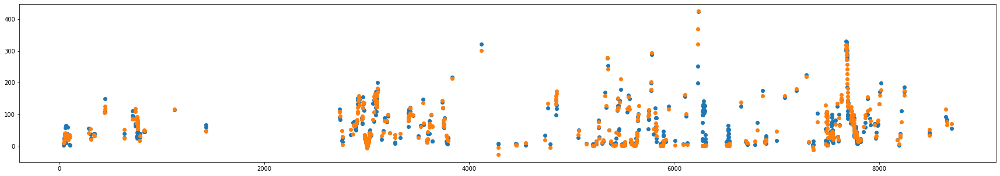

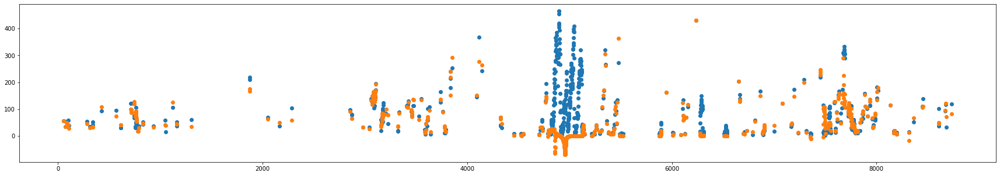

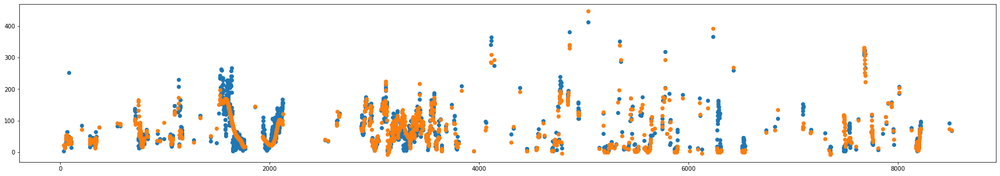

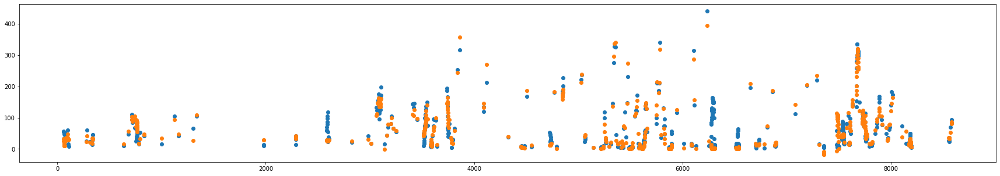

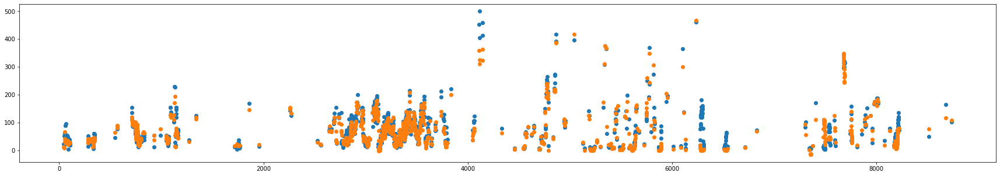

In [37]:
for i in range(10):
    plt.figure(figsize=(30,5))
    plt.scatter(input[missing_index[i] == 1].cpu().detach().numpy(), real_target[i][missing_index[i] == 1].cpu().detach().numpy())
    plt.scatter(input[missing_index[i] == 1].cpu().detach().numpy(), pred_[i][missing_index[i] == 1].cpu().detach().numpy())

In [38]:
torch.mean(torch.abs(real_target[[missing_index == 1]] - pred_[[missing_index == 1]]))

tensor(25.5570, device='cuda:0', dtype=torch.float64)

In [39]:
b = torch.abs(real_target[[missing_index == 1]] - pred_[[missing_index == 1]])
b[b < 20].size()

torch.Size([6353])

In [40]:
torch.mean(b[b < 30])

tensor(10.2912, device='cuda:0', dtype=torch.float64)

In [41]:
b[b < 30].size()

torch.Size([7356])

In [42]:
b.size()

torch.Size([9395])